# 13 — Encoding Manifold-Based Subpopulation Analysis

**Core claim:** Decoding equivalence ≠ representational equivalence.

Three experiments, each building toward the adversarial demonstration:

1. **Random sampling** — baseline: visualise selected neurons on encoding manifold, compute all decoding scores
2. **Manifold-region biased sampling** — select neurons from a spatial region of the MDS embedding, compare to random
3. **Synthetic clustered manifold** — construct a new population that replicates decoding metrics while reshaping encoding manifold topology from smooth → clustered

Requires: `load_for_explorer('V1')` to have been run (notebook 03 must have generated `data/graphs/V1_*.npz`).

In [1]:
import sys, os, warnings, time, math
sys.path.insert(0, '..')
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa

from src.cache_utils import load_for_explorer
from src.tensor_utils import select_sf_stims_for_decoding
from src.subpop_utils import (
    select_neurons_by_bbox,
    select_neurons_by_radius,
    compute_decoding_manifold,
    compute_decoding_trajectories,
    knn_decoding_accuracy,
    rdm_correlation,
    linear_cka,
    procrustes_r2,
    variance_reproduced,
    time_resolved_rsa,
    trajectory_arclength_ratio,
    speed_profile_correlation,
    trajectory_procrustes_r2,
    plot_neuron_locations_in_manifold,
    plot_encoding_manifold_3d,
    create_synthetic_clustered_population,
    create_clustered_by_amplification,
    create_clustered_by_centroid,
    compute_encoding_manifold_from_tensor,
)

BASEDIR_FIG = '../fig/subpop_critique'
os.makedirs(BASEDIR_FIG, exist_ok=True)

# Colour palette for decoding manifold — matches notebook 04 exactly
_PALETTE = ['#0070C0', '#00B0F0', '#00B050', '#92D050', '#FF0000', '#FFC000',
             '#7030A0', '#FF6600', '#339933', '#CC0066', '#009999', '#996633']

from sklearn.decomposition import PCA as _PCA

try:
    from DSA import DSA as _DSA_cls
    HAS_DSA = True
except ImportError:
    HAS_DSA = False
    print('DSA package not available — dsa metric will be NaN. Install: pip install dsa-analysis')


def compute_dsa_sweep(tensor_full, tensor_sub, n_components=10, n_delays=1, lamb=1e-2):
    """DSA similarity (1 − distance) comparing subpopulation to full population dynamics.

    Follows the preprocessing pipeline of notebook 09 (compute_dsa_score):
    (N, S, D, T) → (n_cond, N, T) → PCA → DSA fit_score → 1 − score

    Returns ~[0, 1] where 1 = dynamics perfectly preserved, lower = more dissimilar.
    Returns np.nan on failure (DSA unavailable, degenerate data, singular matrix).

    Parameters
    ----------
    n_delays : int
        Delay-embedding depth for Hankel-matrix construction (default 1 = no embedding).
    lamb : float
        Tikhonov regularisation for DMD fitting; prevents singular-matrix NaN (default 1e-2).
    """
    if not HAS_DSA:
        return np.nan
    try:
        N, NSTIMS, NDIRS, T = tensor_full.shape
        k = tensor_sub.shape[0]
        n_cond = NSTIMS * NDIRS

        # (N, S, D, T) → (n_cond, n_neurons, T) — matches notebook 09 input format
        data1 = tensor_full.transpose(1, 2, 0, 3).reshape(n_cond, N, T)
        data2 = tensor_sub.transpose(1, 2, 0, 3).reshape(n_cond, k, T)

        # Flatten to (n_cond*T, n_neurons) for PCA — exact match to notebook 09
        d1 = np.transpose(data1, (0, 2, 1)).reshape(-1, data1.shape[1])
        d2 = np.transpose(data2, (0, 2, 1)).reshape(-1, data2.shape[1])

        # Replace NaN (padded frames in variable-length stimuli) with 0
        # so PCA and DSA fitting don't propagate NaN.
        d1 = np.where(np.isfinite(d1), d1, 0.0)
        d2 = np.where(np.isfinite(d2), d2, 0.0)

        n_comp1 = min(n_components, d1.shape[1], n_cond * T - 1)
        n_comp2 = min(n_components, d2.shape[1], n_cond * T - 1)
        n_comp  = min(n_comp1, n_comp2)
        if n_comp < 1:
            return np.nan

        d1r = _PCA(n_components=n_comp).fit_transform(d1).reshape(n_cond, T, n_comp)
        d2r = _PCA(n_components=n_comp).fit_transform(d2).reshape(n_cond, T, n_comp)

        try:
            dsa = _DSA_cls(X=d1r, Y=d2r, n_delays=n_delays, lamb=lamb)
        except TypeError:
            dsa = _DSA_cls(X=d1r, Y=d2r, n_delays=n_delays)
        score = np.nanmean(dsa.fit_score())
        # Return 1-distance
        return float(1-score)
    except Exception:
        return np.nan

## 0 — Load data

In [2]:
PREFIX = 'allen_VISp'

t0 = time.time()
data = load_for_explorer(PREFIX)
print(f'Loaded {PREFIX} in {time.time()-t0:.1f}s')

# Full-population encoding manifold (CP-based pipeline)
embedding_full = data['embedding_']        # (N_nonout, 10)  MDS coords

# Raw tensor for decoding — shape from explorer is (N, S, T, D); transpose to (N, S, D, T)
tensor4d_NSDT = data['tensor4d_raw'].transpose(0, 1, 3, 2)   # (N_nonout, S, D, T)

# For 11-stim datasets (FNN/FlyVis/CORnet/MouseNet/R(2+1)D), select 6 stimuli
# by population-level SF majority vote — mirrors notebook 03 / build.py logic.
# Allen and natural-movie datasets already have ≤ 6 stims; this is a no-op for them.
if tensor4d_NSDT.shape[1] == 11:
    _chosen_idx, tensor4d_NSDT = select_sf_stims_for_decoding(tensor4d_NSDT)
    print(f'  SF selection → stim indices {_chosen_idx}')

NSTIMS   = tensor4d_NSDT.shape[1]   # 6 after SF selection, unchanged otherwise
NDIRS    = data['NDIRS']
N_nonout = len(embedding_full)

# Stimulus colours matched to nb04 palette
STIM_COLORS = (_PALETTE * math.ceil(NSTIMS / len(_PALETTE)))[:NSTIMS]

# Stimulus labels for LOO k-NN: each of the S*D points labelled by stimulus index
stim_labels = np.repeat(np.arange(tensor4d_NSDT.shape[1]), NDIRS)    # (S*D,) — use raw stim count

print(f'N_nonout={N_nonout}, NSTIMS={NSTIMS}, NDIRS={NDIRS}')
print(f'tensor4d shape (N,S,D,T): {tensor4d_NSDT.shape}')
print(f'embedding shape: {embedding_full.shape}')
print(f'STIM_COLORS ({len(STIM_COLORS)}): {STIM_COLORS}')


../data/decompositions/allen_VISp-relNorm_sig3_n1962-deepnet-shift*_F*.mat
F12: (5)
Loaded allen_VISp in 6.4s
N_nonout=1955, NSTIMS=5, NDIRS=8
tensor4d shape (N,S,D,T): (1955, 5, 8, 40)
embedding shape: (1955, 10)
STIM_COLORS (5): ['#0070C0', '#00B0F0', '#00B050', '#92D050', '#FF0000']


In [3]:
# Full-population decoding (reference for all comparisons)
coords_full, _ = compute_decoding_manifold(tensor4d_NSDT)
acc_full = knn_decoding_accuracy(coords_full, stim_labels)
print(f'Full population kNN accuracy: {acc_full:.3f}')

Full population kNN accuracy: 0.125


In [4]:
# Helper: evaluate and visualise a subpopulation
def evaluate_subpop(idx, label='subpop', show_plot=True):
    """Compute all 5 decoding metrics for a subpopulation and visualise it.

    Three-panel figure:
      1. Encoding manifold — full pop in gray, selected in orange
      2. Decoding manifold — stimulus-coloured scatter (nb04 palette)
      3. Decoding trajectories — time-resolved PCA paths
    """
    idx = np.asarray(idx)
    mask = np.zeros(N_nonout, dtype=bool)
    mask[idx] = True

    tensor_sub = tensor4d_NSDT[idx]             # (k, S, D, T)
    coords_sub, _ = compute_decoding_manifold(tensor_sub)
    trajs_sub, _  = compute_decoding_trajectories(tensor_sub)

    acc = knn_decoding_accuracy(coords_sub, stim_labels)
    rdm = rdm_correlation(tensor4d_NSDT, tensor_sub)
    cka = linear_cka(tensor4d_NSDT, tensor_sub)
    r2  = procrustes_r2(coords_full, coords_sub)
    var = variance_reproduced(coords_full, coords_sub)

    r2_str  = f'{r2:.3f}'  if (r2  is not None and not np.isnan(r2))  else ' nan'
    var_str = f'{var:.3f}' if (var is not None and not np.isnan(var)) else ' nan'
    print(f'[{label}]  N={len(idx)} ({100*len(idx)/N_nonout:.0f}%)'
          f'  kNN={acc:.3f} ({100*acc/acc_full:.0f}% of full)'
          f'  RDM \u03c1={rdm:.3f}  CKA={cka:.3f}  R\u00b2={r2_str}  var={var_str}')

    if show_plot:
        fig = plt.figure(figsize=(18, 5))

        # Panel 1 — encoding manifold
        ax1 = fig.add_subplot(1, 3, 1, projection='3d')
        Y = embedding_full
        ax1.scatter(*Y[~mask].T[:3], c='lightgray', s=8, alpha=0.4,
                    edgecolors='none', depthshade=False)
        ax1.scatter(*Y[mask].T[:3], c='darkorange', s=30, alpha=0.9,
                    edgecolors='none', depthshade=False)
        ax1.set_xticks([]); ax1.set_yticks([]); ax1.set_zticks([])
        ax1.set_title(f'Encoding manifold\n(orange = selected, N={len(idx)})', fontsize=9)
        ax1.view_init(elev=30, azim=45)

        # Panel 2 — decoding manifold
        ax2 = fig.add_subplot(1, 3, 2, projection='3d')
        for si in range(NSTIMS):
            sel = stim_labels == si
            lbl = data['my_stims'][si] if si < len(data['my_stims']) else f's{si}'
            ax2.scatter(coords_sub[sel, 0], coords_sub[sel, 1], coords_sub[sel, 2],
                        c=STIM_COLORS[si % len(STIM_COLORS)], s=120, alpha=1.0,
                        edgecolors='none', depthshade=False, label=lbl)
        ax2.set_xticks([]); ax2.set_yticks([]); ax2.set_zticks([])
        ax2.set_title(f'Decoding manifold\nkNN={acc:.3f}  RDM \u03c1={rdm:.3f}', fontsize=9)
        ax2.view_init(elev=30, azim=45)
        ax2.legend(fontsize=7, loc='upper left', framealpha=0.6)

        # Panel 3 — decoding trajectories
        ax3 = fig.add_subplot(1, 3, 3, projection='3d')
        for i, traj in enumerate(trajs_sub):
            si = i // NDIRS
            col = STIM_COLORS[si % len(STIM_COLORS)]
            valid = ~np.any(np.isnan(traj), axis=1)
            tv = traj[valid]
            if len(tv) < 2:
                continue
            ax3.plot(tv[:, 0], tv[:, 1], tv[:, 2],
                     color=col, linewidth=2, alpha=0.3)
            ax3.scatter(tv[0, 0], tv[0, 1], tv[0, 2],
                        color='black', s=25, edgecolors='none', depthshade=False)
            ax3.scatter(tv[-1, 0], tv[-1, 1], tv[-1, 2],
                        color=col, s=100, edgecolors='none', depthshade=False)
        ax3.set_xticks([]); ax3.set_yticks([]); ax3.set_zticks([])
        ax3.set_title(f'Decoding trajectories\nCKA={cka:.3f}  R\u00b2={r2_str}', fontsize=9)
        ax3.view_init(elev=30, azim=45)

        fig.suptitle(label, fontsize=11, y=1.01)
        plt.tight_layout()
        plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_{label.replace(" ", "_")}.pdf',
                    bbox_inches='tight')
        plt.show()

    return dict(acc=acc, rdm=rdm, cka=cka, r2=r2, var=var, mask=mask, n=len(idx))


In [5]:
# Helper: grouped bar chart comparing decoding metrics across conditions
def plot_metrics_bar(conditions, title='Decoding metrics comparison', save_suffix=None):
    """Grouped bar chart of all 5 decoding metrics.

    Parameters
    ----------
    conditions : list of (label, results_list, color)
        results_list is a list of metric dicts; mean ± std taken if multiple.
    title : str
    save_suffix : str or None  — saved to BASEDIR_FIG if provided
    """
    metric_keys   = ['acc',     'rdm',    'cka',  'r2',            'var']
    metric_labels = ['kNN acc', 'RDM \u03c1', 'CKA', 'Procrustes R\u00b2', 'Var. repr.']
    full_refs     = dict(acc=acc_full, rdm=1.0, cka=1.0, r2=1.0, var=1.0)

    n_cond  = len(conditions)
    x       = np.arange(len(metric_keys))
    width   = 0.18
    offsets = np.linspace(-(n_cond - 1) / 2, (n_cond - 1) / 2, n_cond) * width

    fig, ax = plt.subplots(figsize=(10, 4))
    for (lbl, res_list, color), offset in zip(conditions, offsets):
        means, errs = [], []
        for k in metric_keys:
            vals = [r[k] for r in res_list
                    if r.get(k) is not None and not np.isnan(r.get(k, np.nan))]
            means.append(np.nanmean(vals) if vals else np.nan)
            errs.append(np.nanstd(vals)   if len(vals) > 1 else 0.0)
        ax.bar(x + offset, means, width=width, color=color, alpha=0.82,
               yerr=errs, capsize=3, label=lbl)

    # Per-metric reference line (dashed, full population)
    for xi, k in enumerate(metric_keys):
        ax.plot([xi + offsets[0] - width / 2, xi + offsets[-1] + width / 2],
                [full_refs[k], full_refs[k]],
                color='black', linewidth=1.5, linestyle='--')

    ax.set_xticks(x)
    ax.set_xticklabels(metric_labels, fontsize=9)
    ax.set_ylabel('Metric value', fontsize=9)
    ax.set_ylim(bottom=0)
    ax.set_title(f'{PREFIX} \u2014 {title}\n(dashed = full-population reference)',
                 fontsize=10)
    ax.legend(fontsize=8, framealpha=0.8, loc='lower right')
    ax.tick_params(labelsize=8)
    plt.tight_layout()
    if save_suffix:
        plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_{save_suffix}.pdf', bbox_inches='tight')
    plt.show()
    return fig, ax


## 1 — Random Sampling

Baseline: randomly sample `N_SAMPLE` neurons, compute all decoding scores vs. full population, and show which neurons are selected on the encoding manifold.

[random N=100 seed=0]  N=100 (5%)  kNN=0.050 (40% of full)  RDM ρ=0.709  CKA=0.871  R²=0.887  var=0.063


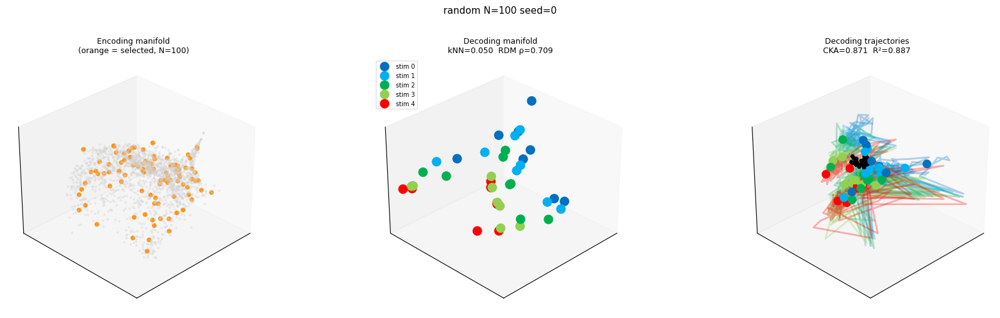

[random N=100 seed=1]  N=100 (5%)  kNN=0.025 (20% of full)  RDM ρ=0.821  CKA=0.886  R²=0.893  var=0.045
[random N=100 seed=2]  N=100 (5%)  kNN=0.275 (220% of full)  RDM ρ=0.914  CKA=0.944  R²=0.927  var=0.047
[random N=100 seed=3]  N=100 (5%)  kNN=0.200 (160% of full)  RDM ρ=0.950  CKA=0.961  R²=0.964  var=0.052
[random N=100 seed=4]  N=100 (5%)  kNN=0.200 (160% of full)  RDM ρ=0.812  CKA=0.922  R²=0.912  var=0.036
  acc : 0.150 ± 0.096
  rdm : 0.841 ± 0.085
  cka : 0.917 ± 0.034
  r2  : 0.917 ± 0.028
  var : 0.049 ± 0.009


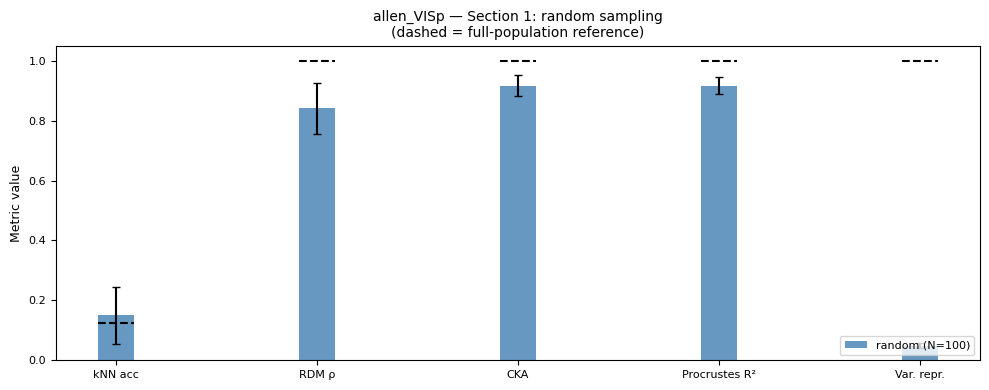

(<Figure size 1000x400 with 1 Axes>,
 <Axes: title={'center': 'allen_VISp — Section 1: random sampling\n(dashed = full-population reference)'}, ylabel='Metric value'>)

In [6]:
# ─── PARAMETERS ──────────────────────────────────────────────────────────────
N_SAMPLE = 100    # number of neurons to sample  ← change this to explore
N_TRIALS = 5      # random draws for mean ± std
# ─────────────────────────────────────────────────────────────────────────────

results_random = []
for seed in range(N_TRIALS):
    rng = np.random.default_rng(seed)
    idx = rng.choice(N_nonout, size=N_SAMPLE, replace=False)
    r = evaluate_subpop(idx, label=f'random N={N_SAMPLE} seed={seed}',
                        show_plot=(seed == 0))   # only plot first trial
    results_random.append(r)

# Summary across trials
for key in ['acc', 'rdm', 'cka', 'r2', 'var']:
    vals = [r[key] for r in results_random]
    print(f'  {key:4s}: {np.nanmean(vals):.3f} ± {np.nanstd(vals):.3f}')

# Metric comparison after Section 1
plot_metrics_bar(
    conditions=[
        (f'random (N={N_SAMPLE})', results_random, 'steelblue'),
    ],
    title='Section 1: random sampling',
    save_suffix='metrics_s1_random',
)


### 1b — Fraction sweep (random baseline)

Vary `N_SAMPLE` to see how decoding degrades as fewer neurons are used.

  f=0.02  k=39  acc=0.170
  f=0.05  k=98  acc=0.210
  f=0.10  k=196  acc=0.115
  f=0.20  k=391  acc=0.140
  f=0.30  k=586  acc=0.145
  f=0.50  k=978  acc=0.105
  f=0.70  k=1368  acc=0.115
  f=1.00  k=1955  acc=0.125


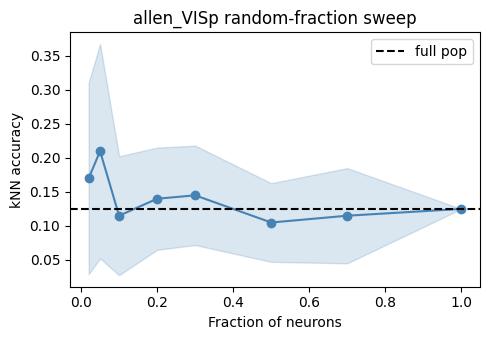

In [7]:
FRACS = [0.02, 0.05, 0.10, 0.20, 0.30, 0.50, 0.70, 1.00]
N_SEEDS_SWEEP = 5

sweep_results = {f: [] for f in FRACS}
for f in FRACS:
    k = max(1, int(round(f * N_nonout)))
    for seed in range(N_SEEDS_SWEEP):
        rng = np.random.default_rng(seed)
        idx = rng.choice(N_nonout, size=k, replace=False)
        tensor_sub = tensor4d_NSDT[idx]
        coords_sub, _ = compute_decoding_manifold(tensor_sub)
        acc = knn_decoding_accuracy(coords_sub, stim_labels)
        sweep_results[f].append(acc)
    mean_acc = np.nanmean(sweep_results[f])
    print(f'  f={f:.2f}  k={k}  acc={mean_acc:.3f}')

fig, ax = plt.subplots(figsize=(5, 3.5))
means = [np.nanmean(sweep_results[f]) for f in FRACS]
stds  = [np.nanstd(sweep_results[f])  for f in FRACS]
ax.plot(FRACS, means, 'o-', color='steelblue')
ax.fill_between(FRACS,
                np.array(means) - np.array(stds),
                np.array(means) + np.array(stds),
                alpha=0.2, color='steelblue')
ax.axhline(acc_full, color='k', linestyle='--', label='full pop')
ax.set_xlabel('Fraction of neurons')
ax.set_ylabel('kNN accuracy')
ax.set_title(f'{PREFIX} random-fraction sweep')
ax.legend()
plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_random_sweep.pdf', bbox_inches='tight')
plt.show()

## 2 — Manifold-Region Biased Sampling

Select neurons from a specific **spatial region** of the encoding manifold (rather than uniformly at random).  Two options:
- **Percentile**: top fraction along a chosen MDS dimension
- **Radius**: all neurons within a Euclidean radius of a seed point

Visualises the same 2-panel layout so selection patterns are directly comparable.

region-percentile DC0 top25%: 489 neurons (25% of N_nonout)
[region-percentile DC0 top25%]  N=489 (25%)  kNN=0.225 (180% of full)  RDM ρ=0.954  CKA=0.981  R²=0.934  var=0.278


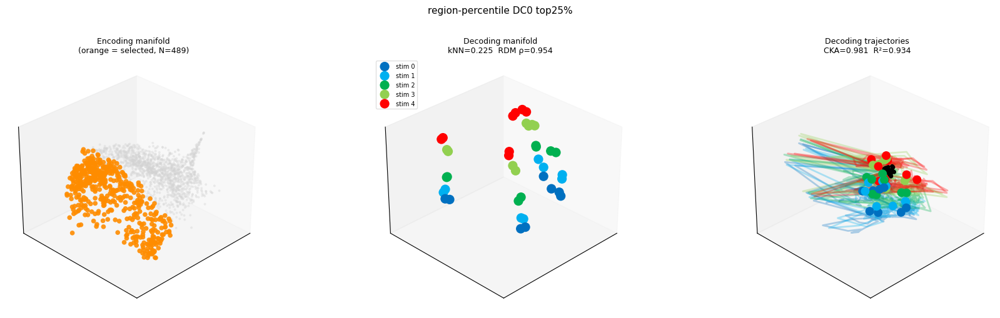

In [8]:
# ─── PARAMETERS ──────────────────────────────────────────────────────────────
REGION_MODE   = 'percentile'   # 'percentile' | 'radius'

# Mode: percentile — select top REGION_FRAC of neurons along DC_IDX
DC_IDX        = 0              # which MDS dimension to use
REGION_FRAC   = 0.25           # top 25% along that dimension

# Mode: radius — select neurons within RADIUS of a seed (most extreme along DC_IDX)
SEED_IDX      = None           # None = auto-pick: most extreme neuron on DC_IDX
RADIUS        = 0.5
# ─────────────────────────────────────────────────────────────────────────────

if REGION_MODE == 'percentile':
    thresh = np.percentile(embedding_full[:, DC_IDX], (1 - REGION_FRAC) * 100)
    mask_region = embedding_full[:, DC_IDX] > thresh
    region_label = f'region-percentile DC{DC_IDX} top{int(REGION_FRAC*100)}%'
else:  # radius
    if SEED_IDX is None:
        SEED_IDX = int(np.argmax(embedding_full[:, DC_IDX]))
    mask_region = select_neurons_by_radius(embedding_full, SEED_IDX, RADIUS)
    region_label = f'region-radius DC{DC_IDX} r={RADIUS} seed={SEED_IDX}'

idx_region = np.where(mask_region)[0]
print(f'{region_label}: {len(idx_region)} neurons ({100*len(idx_region)/N_nonout:.0f}% of N_nonout)')
r_region = evaluate_subpop(idx_region, label=region_label)

[random N=489 seed=0]  N=489 (25%)  kNN=0.300 (240% of full)  RDM ρ=0.943  CKA=0.975  R²=0.951  var=0.215
[random N=489 seed=1]  N=489 (25%)  kNN=0.075 (60% of full)  RDM ρ=0.953  CKA=0.982  R²=0.976  var=0.206
[random N=489 seed=2]  N=489 (25%)  kNN=0.075 (60% of full)  RDM ρ=0.965  CKA=0.980  R²=0.981  var=0.276
[random N=489 seed=3]  N=489 (25%)  kNN=0.050 (40% of full)  RDM ρ=0.948  CKA=0.977  R²=0.971  var=0.273
[random N=489 seed=4]  N=489 (25%)  kNN=0.075 (60% of full)  RDM ρ=0.951  CKA=0.974  R²=0.928  var=0.234

--- Comparison at N=489 ---
metric    region     random (mean±std)
acc        0.225     0.115 ± 0.093
rdm        0.954     0.952 ± 0.007
cka        0.981     0.978 ± 0.003
r2         0.934     0.961 ± 0.020


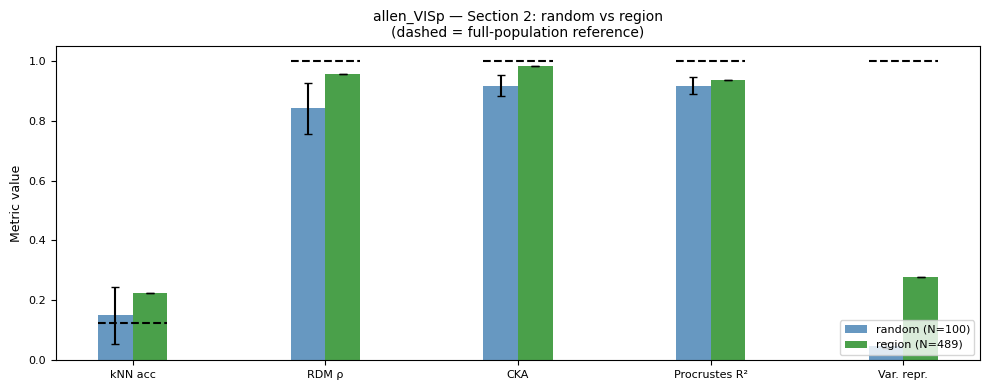

(<Figure size 1000x400 with 1 Axes>,
 <Axes: title={'center': 'allen_VISp — Section 2: random vs region\n(dashed = full-population reference)'}, ylabel='Metric value'>)

In [9]:
# Compare region-selection to same-size random selection
k_region = len(idx_region)
results_rand_matched = []
for seed in range(N_TRIALS):
    rng = np.random.default_rng(seed + 100)
    idx = rng.choice(N_nonout, size=k_region, replace=False)
    results_rand_matched.append(
        evaluate_subpop(idx, label=f'random N={k_region} seed={seed}', show_plot=False))

print(f'\n--- Comparison at N={k_region} ---')
print(f"{'metric':6s}  {'region':>8s}  {'random (mean±std)':>20s}")
for key in ['acc', 'rdm', 'cka', 'r2']:
    rv = [r[key] for r in results_rand_matched]
    print(f"{key:6s}  {r_region[key]:8.3f}  "
          f"{np.nanmean(rv):8.3f} ± {np.nanstd(rv):.3f}")

# Cumulative metric comparison after Section 2
plot_metrics_bar(
    conditions=[
        (f'random (N={N_SAMPLE})',      results_random, 'steelblue'),
        (f'region (N={r_region["n"]})', [r_region],     'forestgreen'),
    ],
    title='Section 2: random vs region',
    save_suffix='metrics_s2_region',
)


In [10]:
# Scan multiple regions — top / bottom / middle thirds along each of first 3 DCs
print(f"\n--- Region sweep: top/mid/bot 1/3 along each DC ---")
print(f"{'region':40s}  {'N':>5s}  {'acc':>6s}  {'rdm':>6s}")
for dc in range(3):
    vals = embedding_full[:, dc]
    lo, hi = np.percentile(vals, [33, 67])
    regions = [
        (f'DC{dc} top 1/3',    vals > hi),
        (f'DC{dc} mid 1/3',    (vals >= lo) & (vals <= hi)),
        (f'DC{dc} bot 1/3',    vals < lo),
    ]
    for lbl, mask in regions:
        idx = np.where(mask)[0]
        tensor_sub = tensor4d_NSDT[idx]
        coords_sub, _ = compute_decoding_manifold(tensor_sub)
        acc = knn_decoding_accuracy(coords_sub, stim_labels)
        rdm = rdm_correlation(tensor4d_NSDT, tensor_sub)
        print(f"{lbl:40s}  {len(idx):>5d}  {acc:>6.3f}  {rdm:>6.3f}")


--- Region sweep: top/mid/bot 1/3 along each DC ---
region                                        N     acc     rdm
DC0 top 1/3                                 645   0.200   0.971
DC0 mid 1/3                                 665   0.050   0.958
DC0 bot 1/3                                 645   0.100   0.927
DC1 top 1/3                                 645   0.050   0.830
DC1 mid 1/3                                 665   0.175   0.946
DC1 bot 1/3                                 645   0.450   0.821
DC2 top 1/3                                 645   0.000   0.957
DC2 mid 1/3                                 665   0.200   0.935
DC2 bot 1/3                                 645   0.250   0.908


In [11]:
stop

NameError: name 'stop' is not defined

## 3 — Synthetic Clustered Manifold

**Key experiment.**

Construct a new population of ≈N neurons with **clustered** encoding manifold topology, while keeping per-stimulus responses locally realistic (shuffled from manifold neighbours).  

**Hypothesis:** Decoding metrics (kNN, RDM ρ, CKA) are preserved, but the encoding manifold shows discrete clusters instead of V1's smooth tubular structure.

In [ ]:
# ─── PARAMETERS ──────────────────────────────────────────────────────────────
N_SEEDS     = 20   # number of clusters (seeds) in synthetic manifold
N_NEIGHBORS = 8    # neighbourhood size for per-stimulus response shuffling
RNG_SEED    = 42
# ─────────────────────────────────────────────────────────────────────────────

t0 = time.time()
tensor4d_synthetic = create_synthetic_clustered_population(
    tensor4d_NSDT, embedding_full,
    n_seeds=N_SEEDS, n_neighbors=N_NEIGHBORS, rng_seed=RNG_SEED
)
N_synth = len(tensor4d_synthetic)
print(f'Synthetic population: N={N_synth} (real N={N_nonout})  [{time.time()-t0:.1f}s]')
print(f'Shape: {tensor4d_synthetic.shape}')

In [ ]:
# 3a — Decoding metrics for synthetic population
coords_synth, _ = compute_decoding_manifold(tensor4d_synthetic)

acc_synth = knn_decoding_accuracy(coords_synth, stim_labels)
rdm_synth = rdm_correlation(tensor4d_NSDT, tensor4d_synthetic)
cka_synth = linear_cka(tensor4d_NSDT, tensor4d_synthetic)
r2_synth  = procrustes_r2(coords_full, coords_synth)
var_synth = variance_reproduced(coords_full, coords_synth)

r2_str  = f'{r2_synth:.3f}'  if (r2_synth  is not None and not np.isnan(r2_synth))  else ' nan'
var_str = f'{var_synth:.3f}' if (var_synth is not None and not np.isnan(var_synth)) else ' nan'

print('Decoding metrics:')
print(f"{'population':30s}  {'kNN':>6s}  {'RDM \u03c1':>7s}  {'CKA':>6s}  {'R\u00b2':>6s}  {'var':>6s}")
print(f"{'V1 full (reference)':30s}  {acc_full:6.3f}  {'1.000':>7s}  {'1.000':>6s}  {'1.000':>6s}  {'1.000':>6s}")
print(f"{'synthetic (clustered)':30s}  {acc_synth:6.3f}  {rdm_synth:7.3f}  {cka_synth:6.3f}  "
      f"{r2_str:>6s}  {var_str:>6s}")


In [ ]:
# 3a-traj — Trajectory metrics for synthetic population
# These compare temporal dynamics (not just static manifolds) between
# the full V1 population and the synthetic clustered population.

trajs_full_ref,  _ = compute_decoding_trajectories(tensor4d_NSDT)
trajs_synth_ref, _ = compute_decoding_trajectories(tensor4d_synthetic)

trsa_profile, trsa_mean       = time_resolved_rsa(tensor4d_NSDT, tensor4d_synthetic)
alr_mean, alr_per_cond        = trajectory_arclength_ratio(trajs_full_ref, trajs_synth_ref)
spc_mean, spc_per_cond        = speed_profile_correlation(trajs_full_ref, trajs_synth_ref)
tproc_mean, tproc_per_cond    = trajectory_procrustes_r2(trajs_full_ref, trajs_synth_ref)

print('Trajectory metrics (V1 full vs synthetic clustered):')
print(f"{'metric':30s}  {'full (ref)':>10s}  {'synthetic':>10s}")
print(f"{'T1  tRSA (mean over time)':30s}  {'1.000':>10s}  {trsa_mean:10.3f}")
print(f"{'T2  Arc-length ratio':30s}  {'1.000':>10s}  {alr_mean:10.3f}")
print(f"{'T3  Speed profile corr.':30s}  {'1.000':>10s}  {spc_mean:10.3f}")
print(f"{'T4  Traj. Procrustes R²':30s}  {'1.000':>10s}  {tproc_mean:10.3f}")

# Plot tRSA profile over time
fig_trsa, ax_trsa = plt.subplots(figsize=(7, 3))
T_val = len(trsa_profile)
ax_trsa.plot(range(T_val), trsa_profile, color='crimson', lw=2)
ax_trsa.axhline(1.0, color='gray', lw=0.8, ls='--', label='reference (full pop)')
ax_trsa.axhline(trsa_mean, color='crimson', lw=1, ls=':', label=f'mean = {trsa_mean:.3f}')
ax_trsa.set_xlabel('Time bin')
ax_trsa.set_ylabel('RSA (Spearman ρ)')
ax_trsa.set_title('T1 — Time-resolved RSA: V1 full vs synthetic clustered', fontsize=10)
ax_trsa.legend(fontsize=9)
ax_trsa.set_ylim(-0.1, 1.05)
plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_tRSA_synthetic.pdf', bbox_inches='tight')
plt.show()


In [ ]:
# 3b — Encoding manifold of real population via direct-PCA pipeline
#      (same method as synthetic for a fair comparison)
print('Building encoding manifold for real population (direct-PCA pipeline)...')
t0 = time.time()
enc_real = compute_encoding_manifold_from_tensor(tensor4d_NSDT)
print(f'  done in {time.time()-t0:.1f}s  '
      f'N_clean={len(enc_real["nonoutliers"])}  nPCs={enc_real["nPCs"]}')

In [ ]:
# 3c — Encoding manifold of synthetic population
print('Building encoding manifold for synthetic population...')
t0 = time.time()
enc_synth = compute_encoding_manifold_from_tensor(tensor4d_synthetic)
print(f'  done in {time.time()-t0:.1f}s  '
      f'N_clean={len(enc_synth["nonoutliers"])}  nPCs={enc_synth["nPCs"]}')

In [ ]:
# 3d — Side-by-side comparison: V1 (standard) | V1 (direct PCA) | Synthetic
#
# Colour by DC0 value (continuous, per-panel normalised).
# Smooth manifold → gradual colour gradient; clustered → abrupt colour patches.
# run_hdbscan_clustering is NOT used here because it requires diffmap_y + nPCs + G;
# load_for_explorer does not return those for the full-population panel.

from matplotlib.colors import Normalize

fig = plt.figure(figsize=(17, 5))
cmap_enc = plt.cm.viridis

panels = [
    (embedding_full,           'V1 full (CP pipeline)'),
    (enc_real['embedding_'],   'V1 full (direct PCA)'),
    (enc_synth['embedding_'],  f'Synthetic (N_seeds={N_SEEDS})'),
]
for pi, (emb, title) in enumerate(panels):
    ax = fig.add_subplot(1, 3, pi + 1, projection='3d')
    dc0  = emb[:, 0]
    norm = Normalize(vmin=dc0.min(), vmax=dc0.max())
    ax.scatter(emb[:, 0], emb[:, 1], emb[:, 2],
               c=cmap_enc(norm(dc0)), s=20, alpha=0.8,
               edgecolors='none', depthshade=False)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
    ax.view_init(elev=30, azim=45)
    ax.set_title(title, fontsize=10)

fig.suptitle(
    'Encoding manifold topology comparison\n'
    'Colour = DC0 (per panel) — smooth gradient → smooth manifold; '
    'abrupt patches → clustered',
    fontsize=11)
plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_encoding_comparison_N{N_SEEDS}seeds.pdf',
            bbox_inches='tight')
plt.show()


In [ ]:
# 3e — Decoding manifold + trajectory comparison: V1 full vs synthetic
trajs_full,  _ = compute_decoding_trajectories(tensor4d_NSDT)
trajs_synth, _ = compute_decoding_trajectories(tensor4d_synthetic)

fig = plt.figure(figsize=(22, 5))
panels = [
    (coords_full,  trajs_full,  f'V1 full — kNN={acc_full:.3f}'),
    (coords_synth, trajs_synth, f'Synthetic — kNN={acc_synth:.3f}'),
]
for pi, (coords, trajs, title) in enumerate(panels):
    # Decoding manifold
    ax_m = fig.add_subplot(1, 4, pi * 2 + 1, projection='3d')
    for si in range(NSTIMS):
        sel = stim_labels == si
        ax_m.scatter(coords[sel, 0], coords[sel, 1], coords[sel, 2],
                     c=STIM_COLORS[si % len(STIM_COLORS)], s=120, alpha=1.0,
                     edgecolors='none', depthshade=False)
    ax_m.set_xticks([]); ax_m.set_yticks([]); ax_m.set_zticks([])
    ax_m.view_init(elev=30, azim=45)
    ax_m.set_title(title, fontsize=10)

    # Decoding trajectories
    ax_t = fig.add_subplot(1, 4, pi * 2 + 2, projection='3d')
    for i, traj in enumerate(trajs):
        si = i // NDIRS
        col = STIM_COLORS[si % len(STIM_COLORS)]
        valid = ~np.any(np.isnan(traj), axis=1)
        tv = traj[valid]
        if len(tv) < 2:
            continue
        ax_t.plot(tv[:, 0], tv[:, 1], tv[:, 2],
                  color=col, linewidth=2, alpha=0.3)
        ax_t.scatter(tv[0, 0], tv[0, 1], tv[0, 2],
                     color='black', s=25, edgecolors='none', depthshade=False)
        ax_t.scatter(tv[-1, 0], tv[-1, 1], tv[-1, 2],
                     color=col, s=100, edgecolors='none', depthshade=False)
    ax_t.set_xticks([]); ax_t.set_yticks([]); ax_t.set_zticks([])
    ax_t.view_init(elev=30, azim=45)
    ax_t.set_title(f'{title.split("—")[0].strip()} — trajectories', fontsize=10)

fig.suptitle('Decoding manifolds — same structure despite different encoding topology',
             fontsize=11)
plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_decoding_comparison.pdf', bbox_inches='tight')
plt.show()

In [ ]:
# 3f \u2014 Final comparison: all conditions including synthetic

# Build synthetic result dict from computed scalars
result_synthetic = dict(acc=acc_synth, rdm=rdm_synth, cka=cka_synth,
                        r2=r2_synth, var=var_synth, n=N_synth)

plot_metrics_bar(
    conditions=[
        (f'random (N={N_SAMPLE})',       results_random,     'steelblue'),
        (f'region (N={r_region["n"]})',  [r_region],         'forestgreen'),
        (f'synthetic ({N_SEEDS} cl.)',   [result_synthetic], 'crimson'),
    ],
    title='Section 3: all subpopulation types',
    save_suffix='metrics_s3_all',
)

# Text table
metric_keys   = ['acc', 'rdm', 'cka', 'r2', 'var']
metric_labels = ['kNN', 'RDM \u03c1', 'CKA', 'R\u00b2', 'var']
all_conds = [
    ('V1 full (reference)',          [dict(acc=acc_full, rdm=1., cka=1., r2=1., var=1.)], N_nonout),
    (f'random N={N_SAMPLE}',         results_random,   N_SAMPLE),
    (f'region N={r_region["n"]}',    [r_region],       r_region['n']),
    (f'synthetic {N_SEEDS} clusters',[result_synthetic],N_synth),
]
hdr = f"{'Population':32s}  {'N':>5s}" + ''.join(f'  {m:>7s}' for m in metric_labels)
print('='*len(hdr)); print('SUMMARY'); print('='*len(hdr)); print(hdr); print('-'*len(hdr))
for lbl, res_list, N_val in all_conds:
    row = f'{lbl:32s}  {N_val:>5d}'
    for k in metric_keys:
        vals = [r[k] for r in res_list
                if r.get(k) is not None and not np.isnan(r.get(k, np.nan))]
        row += f'  {np.nanmean(vals):7.3f}' if vals else f'  {"nan":>7s}'
    print(row)
print('='*len(hdr))


## 6 — Clustered Subpopulation via Random Seeds + Nearest Neighbors

Select **n** neurons at random on the encoding manifold as cluster seeds, then for each seed take its **m** closest neighbors (in MDS embedding space). The resulting subpopulation consists of real neurons grouped into tight spatial clusters on the manifold.

This tests whether a subpopulation that covers only *local patches* of the encoding manifold can still replicate full-population decoding performance.

In [12]:
# ─── PARAMETERS ──────────────────────────────────────────────────────────────
N_SEEDS_SEC6    = 7     # number of random seed neurons
M_NEIGHBORS_SEC6 = 20    # nearest neighbors per seed (total subpop ≈ n * m)
RNG_SEED_SEC6   = 0     # random seed for selecting the n neurons
# ─────────────────────────────────────────────────────────────────────────────

Section 6: 7 random seeds × 20 neighbors → 147 unique neurons (7.5% of N_nonout)

Instantaneous decoding metrics:
  kNN=0.100  RDM ρ=0.916  CKA=0.949  R²=0.900  var=0.120  DSA=0.967

Trajectory metrics (vs V1 full):
  tRSA=0.835  ALR=0.476  SPC=0.912  tProc R²=0.637


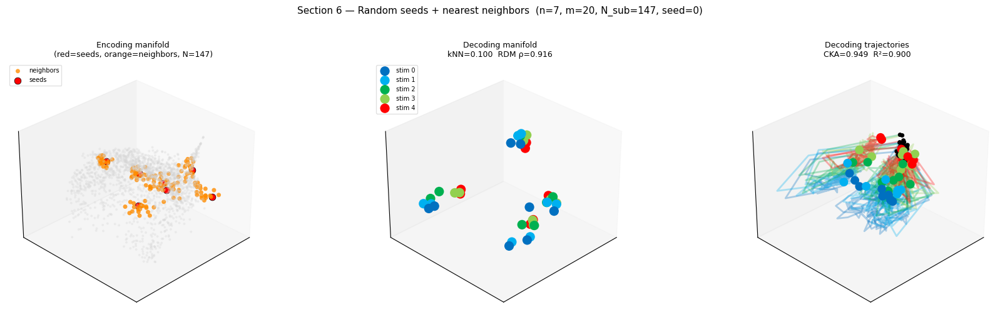

In [13]:


from scipy.spatial.distance import cdist

rng6 = np.random.default_rng(RNG_SEED_SEC6)

# 1. Pick n random seed indices on the encoding manifold
seed_indices_6 = rng6.choice(N_nonout, size=N_SEEDS_SEC6, replace=False)

# 2. For each seed, find its m nearest neighbors in the MDS embedding
#    Use all dimensions of embedding_full for distance computation
dists_to_seeds = cdist(embedding_full, embedding_full[seed_indices_6])  # (N_nonout, n)
selected_set = set(seed_indices_6.tolist())
for si in range(N_SEEDS_SEC6):
    nn_order = np.argsort(dists_to_seeds[:, si])
    count = 0
    for j in nn_order:
        if j in selected_set:
            continue
        selected_set.add(j)
        count += 1
        if count >= M_NEIGHBORS_SEC6:
            break

idx_sec6 = np.array(sorted(selected_set))
print(f'Section 6: {N_SEEDS_SEC6} random seeds × {M_NEIGHBORS_SEC6} neighbors '
      f'→ {len(idx_sec6)} unique neurons ({100*len(idx_sec6)/N_nonout:.1f}% of N_nonout)')

# 3. Build subpopulation tensor
tensor_sec6 = tensor4d_NSDT[idx_sec6]

# 4. Compute decoding manifold & trajectories
coords_sec6, _ = compute_decoding_manifold(tensor_sec6)
trajs_sec6, _  = compute_decoding_trajectories(tensor_sec6)

# Full-population trajectories (reuse if available, else compute)
try:
    trajs_full_sec6 = trajs_full_ref
except NameError:
    trajs_full_sec6, _ = compute_decoding_trajectories(tensor4d_NSDT)

# 5. Instantaneous decoding metrics
acc_sec6 = knn_decoding_accuracy(coords_sec6, stim_labels)
rdm_sec6 = rdm_correlation(tensor4d_NSDT, tensor_sec6)
cka_sec6 = linear_cka(tensor4d_NSDT, tensor_sec6)
r2_sec6  = procrustes_r2(coords_full, coords_sec6)
var_sec6 = variance_reproduced(coords_full, coords_sec6)

# 6. Trajectory (over-time) metrics
trsa_profile_6, trsa_mean_6 = time_resolved_rsa(tensor4d_NSDT, tensor_sec6)
alr_mean_6, alr_per_6       = trajectory_arclength_ratio(trajs_full_sec6, trajs_sec6)
spc_mean_6, spc_per_6       = speed_profile_correlation(trajs_full_sec6, trajs_sec6)
tproc_mean_6, tproc_per_6   = trajectory_procrustes_r2(trajs_full_sec6, trajs_sec6)

dsa_sec6 = compute_dsa_sweep(tensor4d_NSDT, tensor_sec6)

print(f'\nInstantaneous decoding metrics:')
print(f"  kNN={acc_sec6:.3f}  RDM ρ={rdm_sec6:.3f}  CKA={cka_sec6:.3f}  "
      f"R²={r2_sec6:.3f}  var={var_sec6:.3f}  DSA={dsa_sec6:.3f}")
print(f'\nTrajectory metrics (vs V1 full):')
print(f"  tRSA={trsa_mean_6:.3f}  ALR={alr_mean_6:.3f}  "
      f"SPC={spc_mean_6:.3f}  tProc R²={tproc_mean_6:.3f}")

# ── 3-panel figure: encoding manifold | decoding manifold | trajectories ──
mask_sec6 = np.zeros(N_nonout, dtype=bool)
mask_sec6[idx_sec6] = True
mask_seeds6 = np.zeros(N_nonout, dtype=bool)
mask_seeds6[seed_indices_6] = True

fig6 = plt.figure(figsize=(18, 5))
fig6.suptitle(f'Section 6 — Random seeds + nearest neighbors  '
              f'(n={N_SEEDS_SEC6}, m={M_NEIGHBORS_SEC6}, '
              f'N_sub={len(idx_sec6)}, seed={RNG_SEED_SEC6})', fontsize=11, y=1.02)

# Panel 1: encoding manifold
ax6_1 = fig6.add_subplot(1, 3, 1, projection='3d')
Y = embedding_full
ax6_1.scatter(*Y[~mask_sec6].T[:3], c='lightgray', s=8, alpha=0.3,
              edgecolors='none', depthshade=False)
ax6_1.scatter(*Y[mask_sec6 & ~mask_seeds6].T[:3], c='darkorange', s=25, alpha=0.8,
              edgecolors='none', depthshade=False, label='neighbors')
ax6_1.scatter(*Y[mask_seeds6].T[:3], c='red', s=60, alpha=1.0,
              edgecolors='black', linewidths=0.5, depthshade=False, label='seeds')
ax6_1.set_xticks([]); ax6_1.set_yticks([]); ax6_1.set_zticks([])
ax6_1.set_title(f'Encoding manifold\n(red=seeds, orange=neighbors, N={len(idx_sec6)})', fontsize=9)
ax6_1.view_init(elev=30, azim=45)
ax6_1.legend(fontsize=7, loc='upper left', framealpha=0.6)

# Panel 2: decoding manifold
ax6_2 = fig6.add_subplot(1, 3, 2, projection='3d')
for si in range(NSTIMS):
    sel = stim_labels == si
    lbl = data['my_stims'][si] if si < len(data['my_stims']) else f's{si}'
    ax6_2.scatter(coords_sec6[sel, 0], coords_sec6[sel, 1], coords_sec6[sel, 2],
                  c=STIM_COLORS[si % len(STIM_COLORS)], s=120, alpha=1.0,
                  edgecolors='none', depthshade=False, label=lbl)
ax6_2.set_xticks([]); ax6_2.set_yticks([]); ax6_2.set_zticks([])
ax6_2.set_title(f'Decoding manifold\nkNN={acc_sec6:.3f}  RDM ρ={rdm_sec6:.3f}', fontsize=9)
ax6_2.view_init(elev=30, azim=45)
ax6_2.legend(fontsize=7, loc='upper left', framealpha=0.6)

# Panel 3: decoding trajectories
ax6_3 = fig6.add_subplot(1, 3, 3, projection='3d')
for i, traj in enumerate(trajs_sec6):
    si = i // NDIRS
    col = STIM_COLORS[si % len(STIM_COLORS)]
    valid = ~np.any(np.isnan(traj), axis=1)
    tv = traj[valid]
    if len(tv) < 2:
        continue
    ax6_3.plot(tv[:, 0], tv[:, 1], tv[:, 2], color=col, linewidth=2, alpha=0.3)
    ax6_3.scatter(tv[0, 0], tv[0, 1], tv[0, 2],
                  color='black', s=25, edgecolors='none', depthshade=False)
    ax6_3.scatter(tv[-1, 0], tv[-1, 1], tv[-1, 2],
                  color=col, s=100, edgecolors='none', depthshade=False)
ax6_3.set_xticks([]); ax6_3.set_yticks([]); ax6_3.set_zticks([])
ax6_3.set_title(f'Decoding trajectories\nCKA={cka_sec6:.3f}  R²={r2_sec6:.3f}', fontsize=9)
ax6_3.view_init(elev=30, azim=45)

plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_sec6_random_seeds_nn.pdf', bbox_inches='tight')
plt.show()


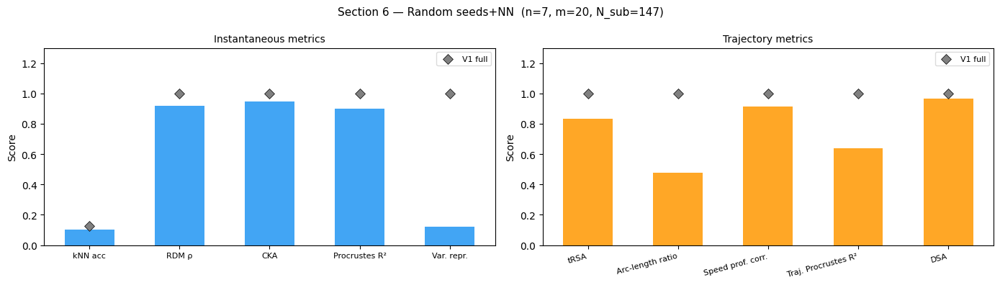

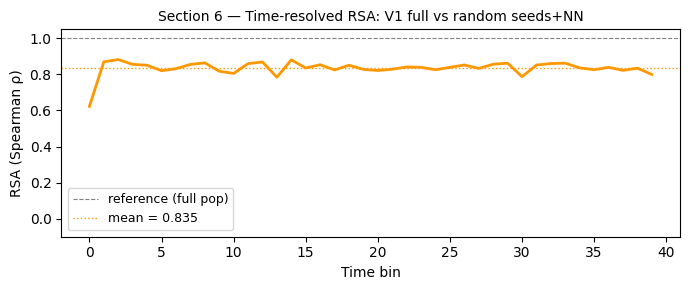


SECTION 6 — SUMMARY
Metric                        V1 full    Seeds+NN
----------------------------------------------------------------------
kNN acc                         0.125       0.100
RDM ρ                           1.000       0.916
CKA                             1.000       0.949
Procrustes R²                   1.000       0.900
Var. repr.                      1.000       0.120
----------------------------------------------------------------------
tRSA                            1.000       0.835
Arc-length ratio                1.000       0.476
Speed prof. corr.               1.000       0.912
Traj. Procrustes R²             1.000       0.637
DSA                             1.000       0.967


In [14]:
# ── Section 6: Combined instantaneous + trajectory metrics ────────────────
metric_keys_6   = ['acc', 'rdm', 'cka', 'r2', 'var']
metric_labels_6 = ['kNN acc', 'RDM ρ', 'CKA', 'Procrustes R²', 'Var. repr.']
full_vals_6     = [acc_full, 1.0, 1.0, 1.0, 1.0]
sub_vals_6      = [acc_sec6, rdm_sec6, cka_sec6, r2_sec6, var_sec6]

traj_keys_6   = ['trsa', 'alr', 'spc', 'tproc', 'dsa']
traj_labels_6 = ['tRSA', 'Arc-length ratio', 'Speed prof. corr.', 'Traj. Procrustes R²', 'DSA']
full_traj_6   = [1.0, 1.0, 1.0, 1.0, 1.0]
sub_traj_6    = [trsa_mean_6, alr_mean_6, spc_mean_6, tproc_mean_6, dsa_sec6]

fig6m, (ax6_inst, ax6_traj) = plt.subplots(1, 2, figsize=(14, 4),
                                            gridspec_kw={'width_ratios': [5, 5]})
fig6m.suptitle(f'Section 6 — Random seeds+NN  (n={N_SEEDS_SEC6}, m={M_NEIGHBORS_SEC6}, '
               f'N_sub={len(idx_sec6)})', fontsize=11)

# Left: instantaneous metrics (blue bars)
x6i = np.arange(len(metric_keys_6))
ax6_inst.bar(x6i, sub_vals_6, 0.55, color='#2196F3', alpha=0.85, zorder=2)
ax6_inst.scatter(x6i, full_vals_6, marker='D', s=50, c='gray', zorder=3,
                 edgecolors='black', linewidths=0.5, label='V1 full')
ax6_inst.set_xticks(x6i)
ax6_inst.set_xticklabels(metric_labels_6, fontsize=8)
ax6_inst.set_ylabel('Score')
ax6_inst.set_ylim(0, 1.3)
ax6_inst.set_title('Instantaneous metrics', fontsize=10)
ax6_inst.legend(fontsize=8, framealpha=0.7)

# Right: trajectory metrics (orange bars)
x6t = np.arange(len(traj_keys_6))
ax6_traj.bar(x6t, sub_traj_6, 0.55, color='#FF9800', alpha=0.85, zorder=2)
ax6_traj.scatter(x6t, full_traj_6, marker='D', s=50, c='gray', zorder=3,
                 edgecolors='black', linewidths=0.5, label='V1 full')
ax6_traj.set_xticks(x6t)
ax6_traj.set_xticklabels(traj_labels_6, rotation=15, ha='right', fontsize=8)
ax6_traj.set_ylabel('Score')
ax6_traj.set_ylim(0, 1.3)
ax6_traj.set_title('Trajectory metrics', fontsize=10)
ax6_traj.legend(fontsize=8, framealpha=0.7)

plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_sec6_metrics.pdf', bbox_inches='tight')
plt.show()

# ── Section 6: tRSA profile over time ────────────────────────────────────
fig6r, ax6r = plt.subplots(figsize=(7, 3))
T6 = len(trsa_profile_6)
ax6r.plot(range(T6), trsa_profile_6, color='#FF9800', lw=2)
ax6r.axhline(1.0, color='gray', lw=0.8, ls='--', label='reference (full pop)')
ax6r.axhline(trsa_mean_6, color='#FF9800', lw=1, ls=':', label=f'mean = {trsa_mean_6:.3f}')
ax6r.set_xlabel('Time bin')
ax6r.set_ylabel('RSA (Spearman ρ)')
ax6r.set_title(f'Section 6 — Time-resolved RSA: V1 full vs random seeds+NN', fontsize=10)
ax6r.legend(fontsize=9)
ax6r.set_ylim(-0.1, 1.05)
plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_sec6_tRSA.pdf', bbox_inches='tight')
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────
print('\n' + '='*70)
print('SECTION 6 — SUMMARY')
print('='*70)
print(f"{'Metric':25s}  {'V1 full':>10s}  {'Seeds+NN':>10s}")
print('-'*70)
for k, lbl, fv, sv in zip(metric_keys_6, metric_labels_6, full_vals_6, sub_vals_6):
    sv_str = f'{sv:.3f}' if sv is not None and not np.isnan(sv) else '  nan'
    print(f"{lbl:25s}  {fv:10.3f}  {sv_str:>10s}")
print('-'*70)
for k, lbl, fv, sv in zip(traj_keys_6, traj_labels_6, full_traj_6, sub_traj_6):
    sv_str = f'{sv:.3f}' if sv is not None and not np.isnan(sv) else '  nan'
    print(f"{lbl:25s}  {fv:10.3f}  {sv_str:>10s}")
print('='*70)


## 7 — Clustered Subpopulation via Evenly Spread Seeds + Nearest Neighbors

Same procedure as Section 6, but instead of picking seeds at random, select the **n most evenly spread neurons** on the encoding manifold using a farthest-point sampling (FPS) strategy. This maximises coverage of the manifold while still forming local clusters from each seed's m nearest neighbors.

**Hypothesis:** Evenly spread seeds should provide better manifold coverage than random seeds, potentially preserving decoding metrics more effectively with fewer total neurons.

FPS seed indices (first 5): [ 174  679  990 1812  213]
Section 7: 50 FPS seeds × 1 neighbors → 100 unique neurons (5.1% of N_nonout)

Instantaneous decoding metrics:
  kNN=0.125  RDM ρ=0.931  CKA=0.953  R²=0.954  var=0.043  DSA=0.957

Trajectory metrics (vs V1 full):
  tRSA=0.795  ALR=0.339  SPC=0.806  tProc R²=0.485


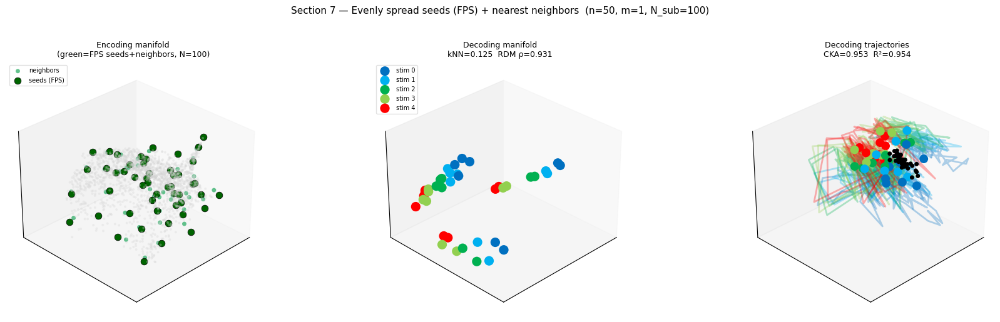

In [15]:
# ─── PARAMETERS ──────────────────────────────────────────────────────────────
N_SEEDS_SEC7     = 50     # number of evenly spread seed neurons
M_NEIGHBORS_SEC7 = 1     # nearest neighbors per seed (total subpop ≈ n * m)
RNG_SEED_SEC7    = 42     # seed for the initial point only (FPS is deterministic after that)
# ─────────────────────────────────────────────────────────────────────────────

from scipy.spatial.distance import cdist

# 1. Farthest-point sampling (FPS) to pick n evenly spread seeds
#    Start from a random point, then iteratively pick the point farthest
#    from all currently selected points.
rng7 = np.random.default_rng(RNG_SEED_SEC7)
emb_3d = embedding_full[:, :3]  # use first 3 MDS dims for spatial distances
pairwise_dists = cdist(emb_3d, emb_3d)  # (N_nonout, N_nonout)

fps_indices = [rng7.integers(N_nonout)]
min_dists = pairwise_dists[fps_indices[0]].copy()  # dist from each point to nearest seed

for _ in range(1, N_SEEDS_SEC7):
    next_idx = np.argmax(min_dists)
    fps_indices.append(next_idx)
    # Update min distances
    min_dists = np.minimum(min_dists, pairwise_dists[next_idx])

seed_indices_7 = np.array(fps_indices)
print(f'FPS seed indices (first 5): {seed_indices_7[:5]}')

# 2. For each seed, find its m nearest neighbors
selected_set_7 = set(seed_indices_7.tolist())
dists_to_seeds_7 = cdist(embedding_full, embedding_full[seed_indices_7])  # (N_nonout, n)
for si in range(N_SEEDS_SEC7):
    nn_order = np.argsort(dists_to_seeds_7[:, si])
    count = 0
    for j in nn_order:
        if j in selected_set_7:
            continue
        selected_set_7.add(j)
        count += 1
        if count >= M_NEIGHBORS_SEC7:
            break

idx_sec7 = np.array(sorted(selected_set_7))
print(f'Section 7: {N_SEEDS_SEC7} FPS seeds × {M_NEIGHBORS_SEC7} neighbors '
      f'→ {len(idx_sec7)} unique neurons ({100*len(idx_sec7)/N_nonout:.1f}% of N_nonout)')

# 3. Build subpopulation tensor
tensor_sec7 = tensor4d_NSDT[idx_sec7]

# 4. Compute decoding manifold & trajectories
coords_sec7, _ = compute_decoding_manifold(tensor_sec7)
trajs_sec7, _  = compute_decoding_trajectories(tensor_sec7)

# Full-population trajectories (reuse)
try:
    trajs_full_sec7 = trajs_full_ref
except NameError:
    trajs_full_sec7, _ = compute_decoding_trajectories(tensor4d_NSDT)

# 5. Instantaneous decoding metrics
acc_sec7 = knn_decoding_accuracy(coords_sec7, stim_labels)
rdm_sec7 = rdm_correlation(tensor4d_NSDT, tensor_sec7)
cka_sec7 = linear_cka(tensor4d_NSDT, tensor_sec7)
r2_sec7  = procrustes_r2(coords_full, coords_sec7)
var_sec7 = variance_reproduced(coords_full, coords_sec7)

# 6. Trajectory (over-time) metrics
trsa_profile_7, trsa_mean_7 = time_resolved_rsa(tensor4d_NSDT, tensor_sec7)
alr_mean_7, alr_per_7       = trajectory_arclength_ratio(trajs_full_sec7, trajs_sec7)
spc_mean_7, spc_per_7       = speed_profile_correlation(trajs_full_sec7, trajs_sec7)
tproc_mean_7, tproc_per_7   = trajectory_procrustes_r2(trajs_full_sec7, trajs_sec7)

dsa_sec7 = compute_dsa_sweep(tensor4d_NSDT, tensor_sec7)

print(f'\nInstantaneous decoding metrics:')
print(f"  kNN={acc_sec7:.3f}  RDM ρ={rdm_sec7:.3f}  CKA={cka_sec7:.3f}  "
      f"R²={r2_sec7:.3f}  var={var_sec7:.3f}  DSA={dsa_sec7:.3f}")
print(f'\nTrajectory metrics (vs V1 full):')
print(f"  tRSA={trsa_mean_7:.3f}  ALR={alr_mean_7:.3f}  "
      f"SPC={spc_mean_7:.3f}  tProc R²={tproc_mean_7:.3f}")

# ── 3-panel figure: encoding manifold | decoding manifold | trajectories ──
mask_sec7 = np.zeros(N_nonout, dtype=bool)
mask_sec7[idx_sec7] = True
mask_seeds7 = np.zeros(N_nonout, dtype=bool)
mask_seeds7[seed_indices_7] = True

fig7 = plt.figure(figsize=(18, 5))
fig7.suptitle(f'Section 7 — Evenly spread seeds (FPS) + nearest neighbors  '
              f'(n={N_SEEDS_SEC7}, m={M_NEIGHBORS_SEC7}, '
              f'N_sub={len(idx_sec7)})', fontsize=11, y=1.02)

# Panel 1: encoding manifold
ax7_1 = fig7.add_subplot(1, 3, 1, projection='3d')
Y7 = embedding_full
ax7_1.scatter(*Y7[~mask_sec7].T[:3], c='lightgray', s=8, alpha=0.3,
              edgecolors='none', depthshade=False)
ax7_1.scatter(*Y7[mask_sec7 & ~mask_seeds7].T[:3], c='mediumseagreen', s=25, alpha=0.8,
              edgecolors='none', depthshade=False, label='neighbors')
ax7_1.scatter(*Y7[mask_seeds7].T[:3], c='darkgreen', s=60, alpha=1.0,
              edgecolors='black', linewidths=0.5, depthshade=False, label='seeds (FPS)')
ax7_1.set_xticks([]); ax7_1.set_yticks([]); ax7_1.set_zticks([])
ax7_1.set_title(f'Encoding manifold\n(green=FPS seeds+neighbors, N={len(idx_sec7)})', fontsize=9)
ax7_1.view_init(elev=30, azim=45)
ax7_1.legend(fontsize=7, loc='upper left', framealpha=0.6)

# Panel 2: decoding manifold
ax7_2 = fig7.add_subplot(1, 3, 2, projection='3d')
for si in range(NSTIMS):
    sel = stim_labels == si
    lbl = data['my_stims'][si] if si < len(data['my_stims']) else f's{si}'
    ax7_2.scatter(coords_sec7[sel, 0], coords_sec7[sel, 1], coords_sec7[sel, 2],
                  c=STIM_COLORS[si % len(STIM_COLORS)], s=120, alpha=1.0,
                  edgecolors='none', depthshade=False, label=lbl)
ax7_2.set_xticks([]); ax7_2.set_yticks([]); ax7_2.set_zticks([])
ax7_2.set_title(f'Decoding manifold\nkNN={acc_sec7:.3f}  RDM ρ={rdm_sec7:.3f}', fontsize=9)
ax7_2.view_init(elev=30, azim=45)
ax7_2.legend(fontsize=7, loc='upper left', framealpha=0.6)

# Panel 3: decoding trajectories
ax7_3 = fig7.add_subplot(1, 3, 3, projection='3d')
for i, traj in enumerate(trajs_sec7):
    si = i // NDIRS
    col = STIM_COLORS[si % len(STIM_COLORS)]
    valid = ~np.any(np.isnan(traj), axis=1)
    tv = traj[valid]
    if len(tv) < 2:
        continue
    ax7_3.plot(tv[:, 0], tv[:, 1], tv[:, 2], color=col, linewidth=2, alpha=0.3)
    ax7_3.scatter(tv[0, 0], tv[0, 1], tv[0, 2],
                  color='black', s=25, edgecolors='none', depthshade=False)
    ax7_3.scatter(tv[-1, 0], tv[-1, 1], tv[-1, 2],
                  color=col, s=100, edgecolors='none', depthshade=False)
ax7_3.set_xticks([]); ax7_3.set_yticks([]); ax7_3.set_zticks([])
ax7_3.set_title(f'Decoding trajectories\nCKA={cka_sec7:.3f}  R²={r2_sec7:.3f}', fontsize=9)
ax7_3.view_init(elev=30, azim=45)

plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_sec7_fps_seeds_nn.pdf', bbox_inches='tight')
plt.show()


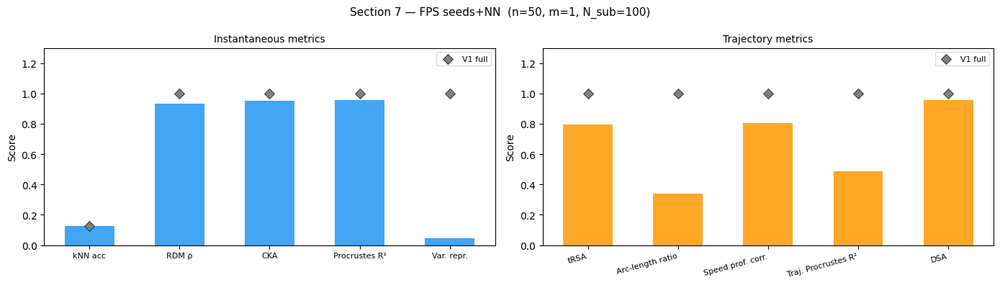

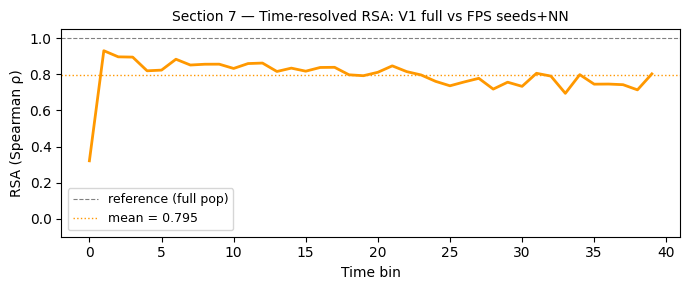

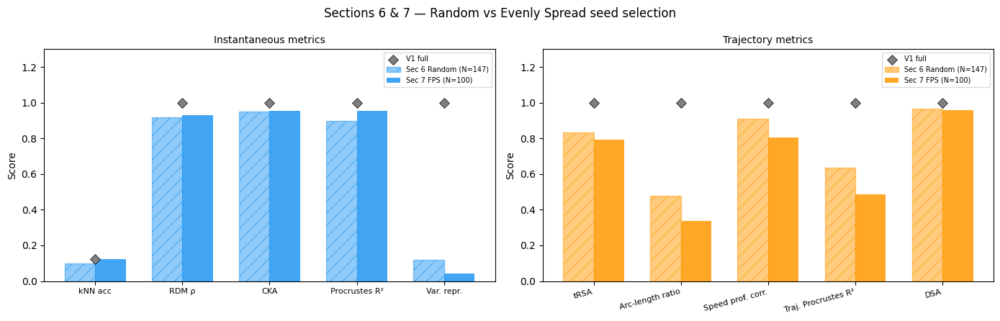


SECTIONS 6 & 7 — COMBINED SUMMARY
Metric                        V1 full   Sec6 Random    Sec7 FPS
--------------------------------------------------------------------------------
kNN acc                         0.125         0.100       0.125
RDM ρ                           1.000         0.916       0.931
CKA                             1.000         0.949       0.953
Procrustes R²                   1.000         0.900       0.954
Var. repr.                      1.000         0.120       0.043
--------------------------------------------------------------------------------
tRSA                            1.000         0.835       0.795
Arc-length ratio                1.000         0.476       0.339
Speed prof. corr.               1.000         0.912       0.806
Traj. Procrustes R²             1.000         0.637       0.485


In [16]:
# ── Section 7: Combined instantaneous + trajectory metrics ────────────────
metric_keys_7   = ['acc', 'rdm', 'cka', 'r2', 'var']
metric_labels_7 = ['kNN acc', 'RDM ρ', 'CKA', 'Procrustes R²', 'Var. repr.']
full_vals_7     = [acc_full, 1.0, 1.0, 1.0, 1.0]
sub_vals_7      = [acc_sec7, rdm_sec7, cka_sec7, r2_sec7, var_sec7]

traj_keys_7   = ['trsa', 'alr', 'spc', 'tproc', 'dsa']
traj_labels_7 = ['tRSA', 'Arc-length ratio', 'Speed prof. corr.', 'Traj. Procrustes R²', 'DSA']
full_traj_7   = [1.0, 1.0, 1.0, 1.0, 1.0]
sub_traj_7    = [trsa_mean_7, alr_mean_7, spc_mean_7, tproc_mean_7, dsa_sec7]

fig7m, (ax7_inst, ax7_traj) = plt.subplots(1, 2, figsize=(14, 4),
                                            gridspec_kw={'width_ratios': [5, 5]})
fig7m.suptitle(f'Section 7 — FPS seeds+NN  (n={N_SEEDS_SEC7}, m={M_NEIGHBORS_SEC7}, '
               f'N_sub={len(idx_sec7)})', fontsize=11)

# Left: instantaneous metrics (blue bars)
x7i = np.arange(len(metric_keys_7))
ax7_inst.bar(x7i, sub_vals_7, 0.55, color='#2196F3', alpha=0.85, zorder=2)
ax7_inst.scatter(x7i, full_vals_7, marker='D', s=50, c='gray', zorder=3,
                 edgecolors='black', linewidths=0.5, label='V1 full')
ax7_inst.set_xticks(x7i)
ax7_inst.set_xticklabels(metric_labels_7, fontsize=8)
ax7_inst.set_ylabel('Score')
ax7_inst.set_ylim(0, 1.3)
ax7_inst.set_title('Instantaneous metrics', fontsize=10)
ax7_inst.legend(fontsize=8, framealpha=0.7)

# Right: trajectory metrics (orange bars)
x7t = np.arange(len(traj_keys_7))
ax7_traj.bar(x7t, sub_traj_7, 0.55, color='#FF9800', alpha=0.85, zorder=2)
ax7_traj.scatter(x7t, full_traj_7, marker='D', s=50, c='gray', zorder=3,
                 edgecolors='black', linewidths=0.5, label='V1 full')
ax7_traj.set_xticks(x7t)
ax7_traj.set_xticklabels(traj_labels_7, rotation=15, ha='right', fontsize=8)
ax7_traj.set_ylabel('Score')
ax7_traj.set_ylim(0, 1.3)
ax7_traj.set_title('Trajectory metrics', fontsize=10)
ax7_traj.legend(fontsize=8, framealpha=0.7)

plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_sec7_metrics.pdf', bbox_inches='tight')
plt.show()

# ── Section 7: tRSA profile over time ────────────────────────────────────
fig7r, ax7r = plt.subplots(figsize=(7, 3))
T7 = len(trsa_profile_7)
ax7r.plot(range(T7), trsa_profile_7, color='#FF9800', lw=2)
ax7r.axhline(1.0, color='gray', lw=0.8, ls='--', label='reference (full pop)')
ax7r.axhline(trsa_mean_7, color='#FF9800', lw=1, ls=':', label=f'mean = {trsa_mean_7:.3f}')
ax7r.set_xlabel('Time bin')
ax7r.set_ylabel('RSA (Spearman ρ)')
ax7r.set_title(f'Section 7 — Time-resolved RSA: V1 full vs FPS seeds+NN', fontsize=10)
ax7r.legend(fontsize=9)
ax7r.set_ylim(-0.1, 1.05)
plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_sec7_tRSA.pdf', bbox_inches='tight')
plt.show()

# ── Combined comparison: Section 6 (random) vs Section 7 (FPS) ───────────
# Side-by-side: instantaneous | trajectory
# Each panel has grouped bars (Sec6 hatched, Sec7 solid) with gray diamonds for full pop
fig_cmp, (ax_ci, ax_ct) = plt.subplots(1, 2, figsize=(14, 4.5),
                                        gridspec_kw={'width_ratios': [5, 5]})
fig_cmp.suptitle('Sections 6 & 7 — Random vs Evenly Spread seed selection', fontsize=12)

# Left: instantaneous metrics
xc = np.arange(len(metric_keys_7))
w_bar = 0.35
sec6_inst = [acc_sec6, rdm_sec6, cka_sec6, r2_sec6, var_sec6]
ax_ci.bar(xc - w_bar/2, sec6_inst, w_bar, color='#2196F3', alpha=0.5,
          hatch='//', edgecolor='#2196F3', label=f'Sec 6 Random (N={len(idx_sec6)})')
ax_ci.bar(xc + w_bar/2, sub_vals_7, w_bar, color='#2196F3', alpha=0.85,
          label=f'Sec 7 FPS (N={len(idx_sec7)})')
ax_ci.scatter(xc, full_vals_7, marker='D', s=50, c='gray', zorder=3,
              edgecolors='black', linewidths=0.5, label='V1 full')
ax_ci.set_xticks(xc)
ax_ci.set_xticklabels(metric_labels_7, fontsize=8)
ax_ci.set_ylabel('Score'); ax_ci.set_ylim(0, 1.3)
ax_ci.legend(fontsize=7, framealpha=0.7)
ax_ci.set_title('Instantaneous metrics', fontsize=10)

# Right: trajectory metrics
xct = np.arange(len(traj_keys_7))
sec6_traj = [trsa_mean_6, alr_mean_6, spc_mean_6, tproc_mean_6, dsa_sec6]
ax_ct.bar(xct - w_bar/2, sec6_traj, w_bar, color='#FF9800', alpha=0.5,
          hatch='//', edgecolor='#FF9800', label=f'Sec 6 Random (N={len(idx_sec6)})')
ax_ct.bar(xct + w_bar/2, sub_traj_7, w_bar, color='#FF9800', alpha=0.85,
          label=f'Sec 7 FPS (N={len(idx_sec7)})')
ax_ct.scatter(xct, full_traj_7, marker='D', s=50, c='gray', zorder=3,
              edgecolors='black', linewidths=0.5, label='V1 full')
ax_ct.set_xticks(xct)
ax_ct.set_xticklabels(traj_labels_7, rotation=15, ha='right', fontsize=8)
ax_ct.set_ylabel('Score'); ax_ct.set_ylim(0, 1.3)
ax_ct.legend(fontsize=7, framealpha=0.7)
ax_ct.set_title('Trajectory metrics', fontsize=10)

plt.tight_layout()
plt.savefig(f'{BASEDIR_FIG}/{PREFIX}_sec6v7_comparison.pdf', bbox_inches='tight')
plt.show()

# ── Summary table ─────────────────────────────────────────────────────────
print('\n' + '='*80)
print('SECTIONS 6 & 7 — COMBINED SUMMARY')
print('='*80)
print(f"{'Metric':25s}  {'V1 full':>10s}  {'Sec6 Random':>12s}  {'Sec7 FPS':>10s}")
print('-'*80)
for lbl, fv, sv6, sv7 in zip(
        metric_labels_7, full_vals_7,
        [acc_sec6, rdm_sec6, cka_sec6, r2_sec6, var_sec6],
        sub_vals_7):
    s6 = f'{sv6:.3f}' if sv6 is not None and not np.isnan(sv6) else '  nan'
    s7 = f'{sv7:.3f}' if sv7 is not None and not np.isnan(sv7) else '  nan'
    print(f"{lbl:25s}  {fv:10.3f}  {s6:>12s}  {s7:>10s}")
print('-'*80)
for lbl, fv, sv6, sv7 in zip(
        traj_labels_7, full_traj_7,
        [trsa_mean_6, alr_mean_6, spc_mean_6, tproc_mean_6],
        sub_traj_7):
    s6 = f'{sv6:.3f}' if sv6 is not None and not np.isnan(sv6) else '  nan'
    s7 = f'{sv7:.3f}' if sv7 is not None and not np.isnan(sv7) else '  nan'
    print(f"{lbl:25s}  {fv:10.3f}  {s6:>12s}  {s7:>10s}")
print('='*80)



Loading allen_VISp...
../data/decompositions/allen_VISp-relNorm_sig3_n1962-deepnet-shift*_F*.mat
F12: (5)
  Loaded in 6.5s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.125

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (5.1%)
  Inst:  kNN=0.125  RDM=0.931  CKA=0.953  R2=0.954  var=0.043
  Traj:  tRSA=0.795  ALR=0.339  SPC=0.806  tProc=0.485  DSA=0.957


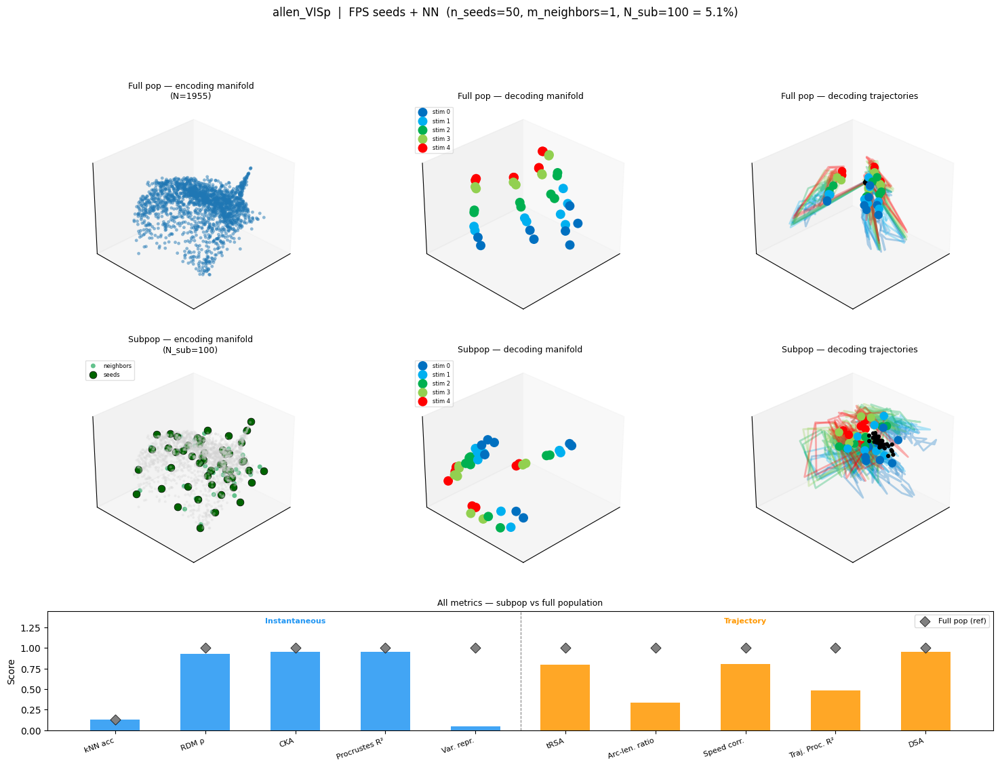

  Saved -> ../fig/subpop_critique/allen_VISp_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (5.1%)
  Inst:  kNN=0.000  RDM=0.803  CKA=0.896  R2=0.676  var=0.091
  Traj:  tRSA=0.714  ALR=0.472  SPC=0.928  tProc=0.707  DSA=0.961


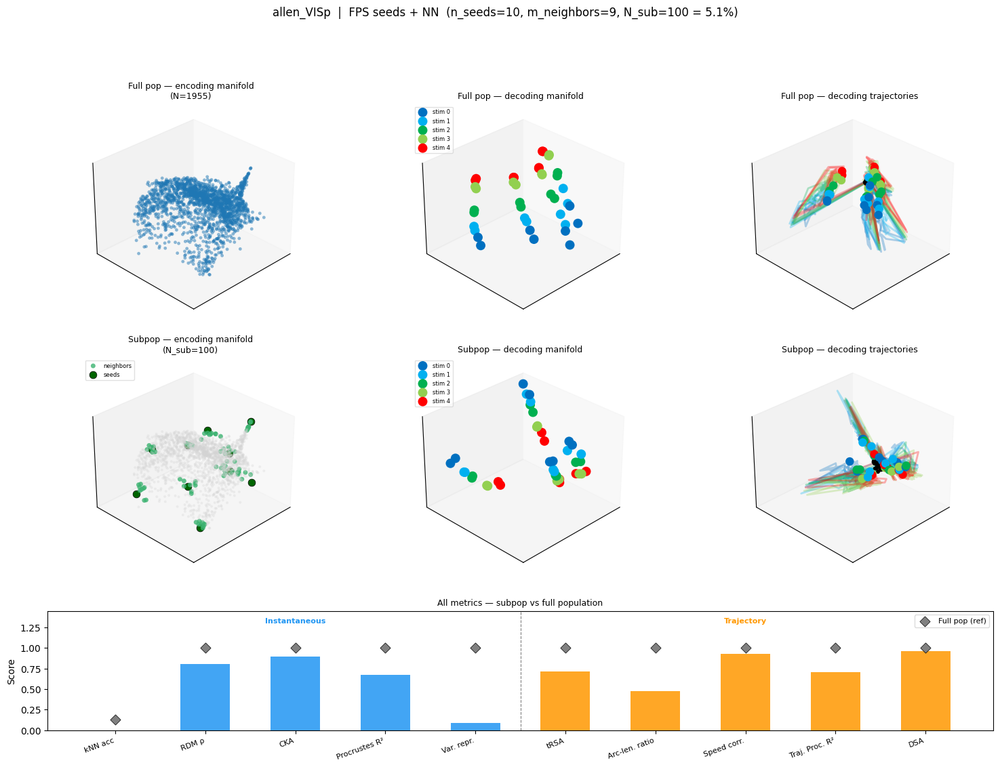

  Saved -> ../fig/subpop_critique/allen_VISp_fps_n10_m9_combined.pdf

Loading allen_VISrl...
../data/decompositions/allen_VISrl-relNorm_sig3_n1409-deepnet-shift*_F*.mat
F12: (5)
  Loaded in 3.6s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.000

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (7.1%)
  Inst:  kNN=0.000  RDM=0.851  CKA=0.937  R2=0.899  var=0.087
  Traj:  tRSA=0.682  ALR=0.593  SPC=0.940  tProc=0.598  DSA=0.955


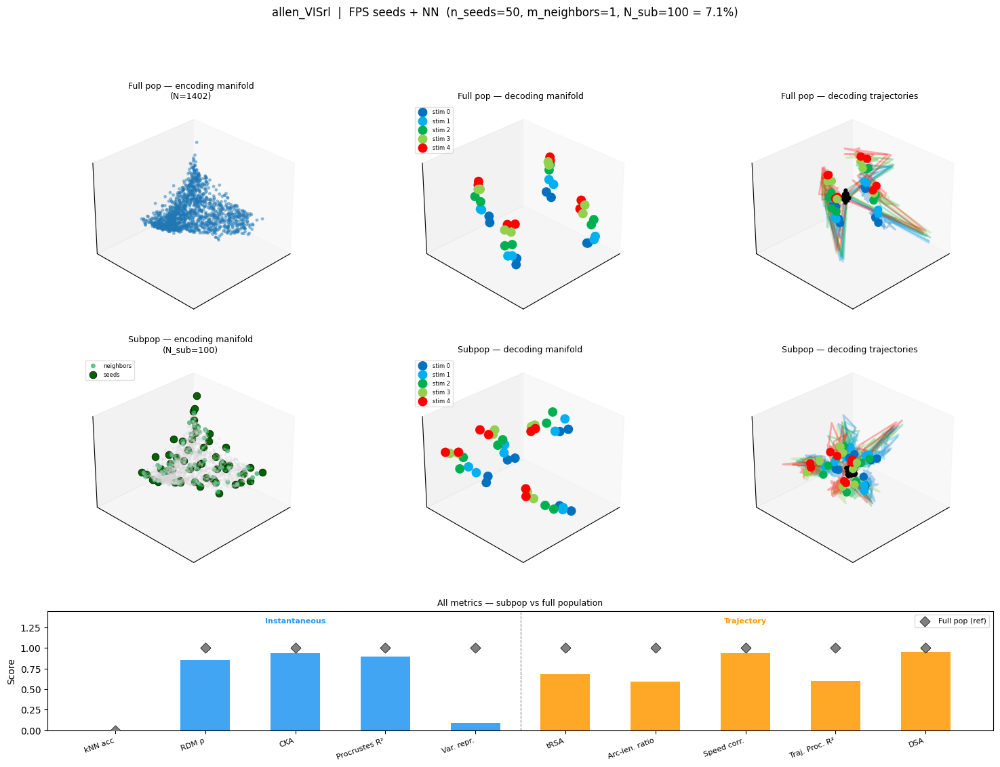

  Saved -> ../fig/subpop_critique/allen_VISrl_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (7.1%)
  Inst:  kNN=0.075  RDM=0.805  CKA=0.907  R2=0.921  var=0.077
  Traj:  tRSA=0.653  ALR=0.717  SPC=0.927  tProc=0.588  DSA=0.896


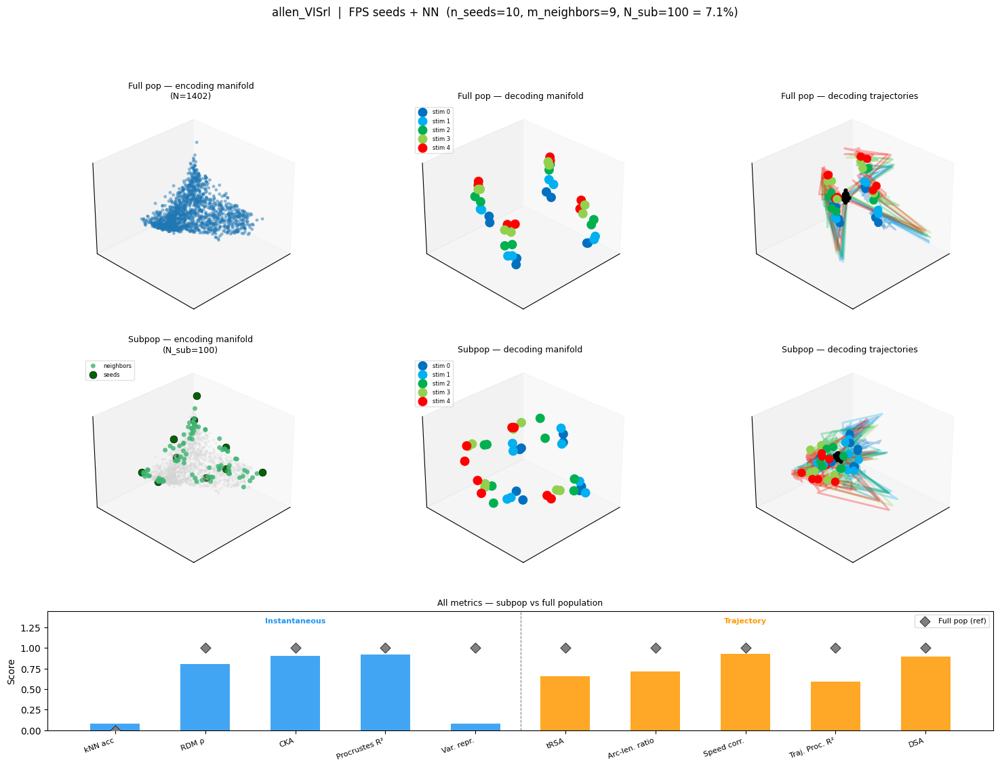

  Saved -> ../fig/subpop_critique/allen_VISrl_fps_n10_m9_combined.pdf

Loading allen_VISam...
../data/decompositions/allen_VISam-relNorm_sig3_n1488-deepnet-shift*_F*.mat
F12: (5)
  Loaded in 4.6s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.025

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (6.8%)
  Inst:  kNN=0.200  RDM=0.832  CKA=0.867  R2=0.870  var=0.089
  Traj:  tRSA=0.731  ALR=0.496  SPC=0.966  tProc=0.801  DSA=0.975


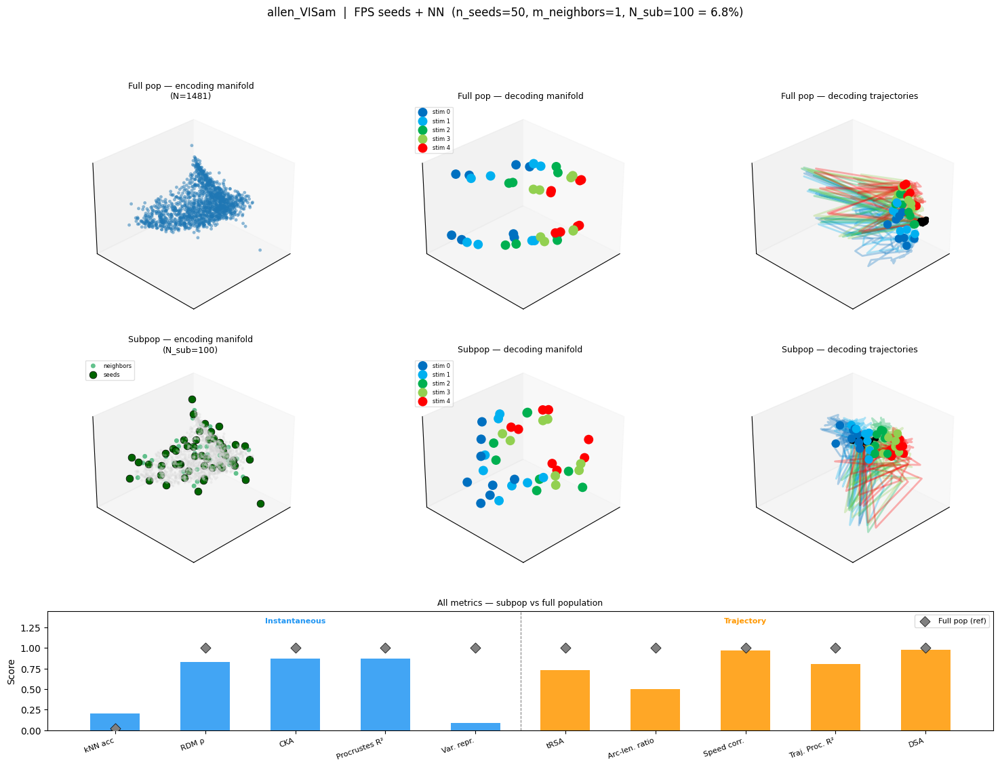

  Saved -> ../fig/subpop_critique/allen_VISam_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (6.8%)
  Inst:  kNN=0.200  RDM=0.838  CKA=0.893  R2=0.890  var=0.110
  Traj:  tRSA=0.755  ALR=0.504  SPC=0.968  tProc=0.821  DSA=0.955


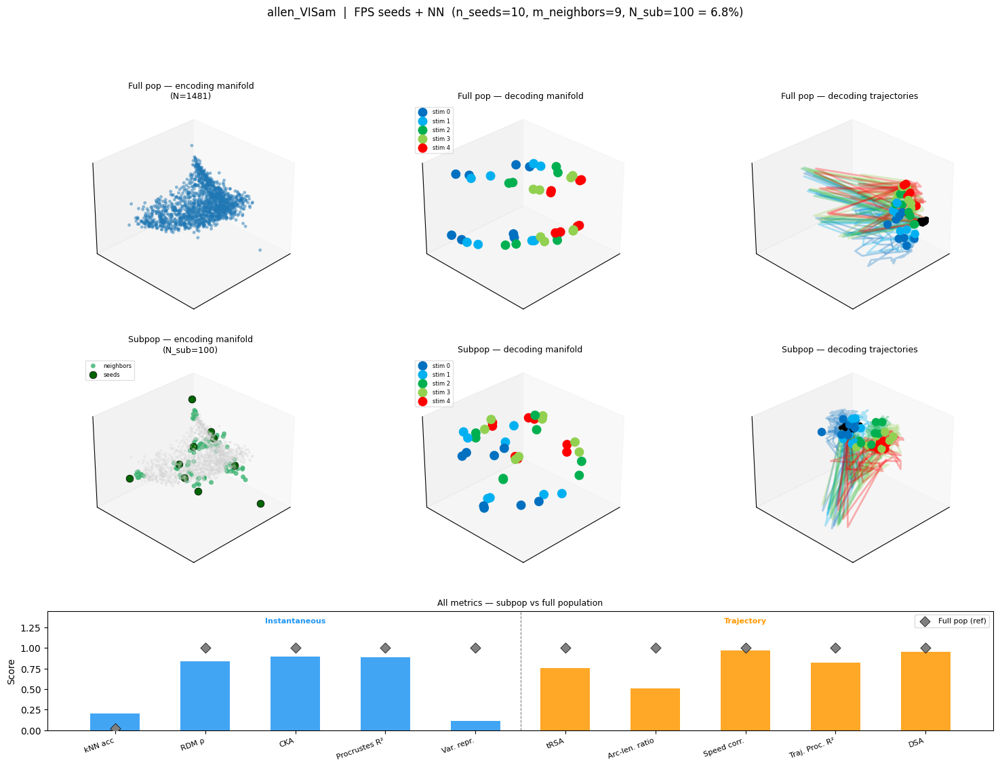

  Saved -> ../fig/subpop_critique/allen_VISam_fps_n10_m9_combined.pdf

Loading allen_VISpm...
../data/decompositions/allen_VISpm-relNorm_sig3_n867-deepnet-shift*_F*.mat
F12: (5)
  Loaded in 2.1s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.050

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (11.6%)
  Inst:  kNN=0.000  RDM=0.891  CKA=0.930  R2=0.581  var=0.209
  Traj:  tRSA=0.805  ALR=0.401  SPC=0.915  tProc=0.646  DSA=0.979


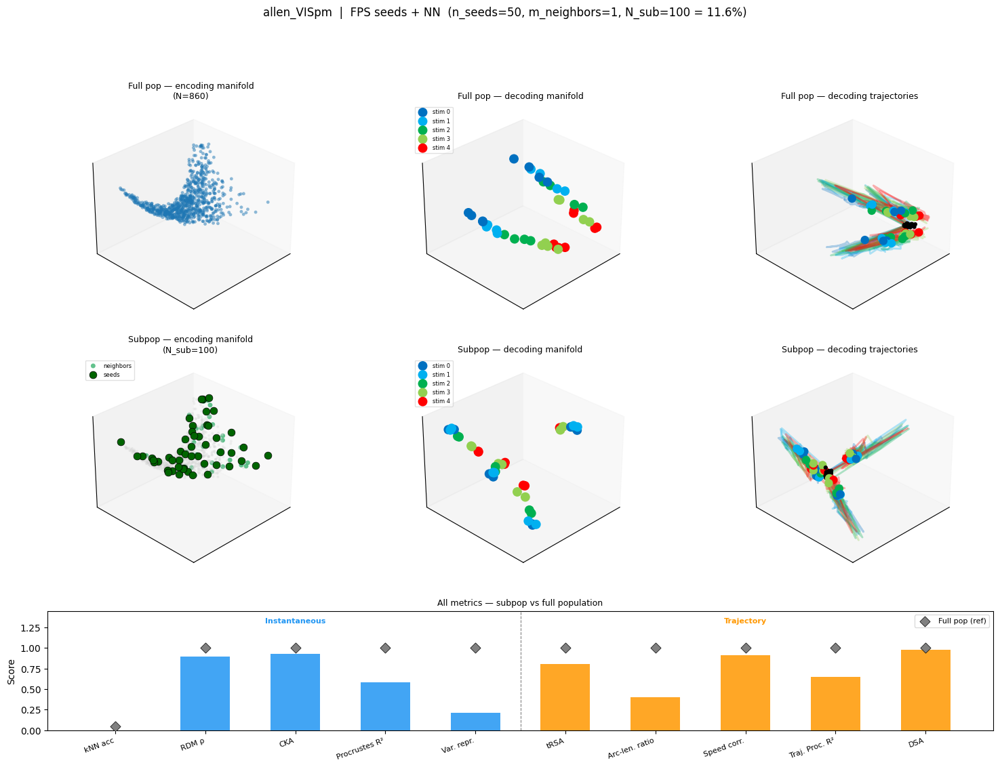

  Saved -> ../fig/subpop_critique/allen_VISpm_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (11.6%)
  Inst:  kNN=0.000  RDM=0.873  CKA=0.912  R2=0.659  var=0.164
  Traj:  tRSA=0.785  ALR=0.517  SPC=0.956  tProc=0.795  DSA=0.977


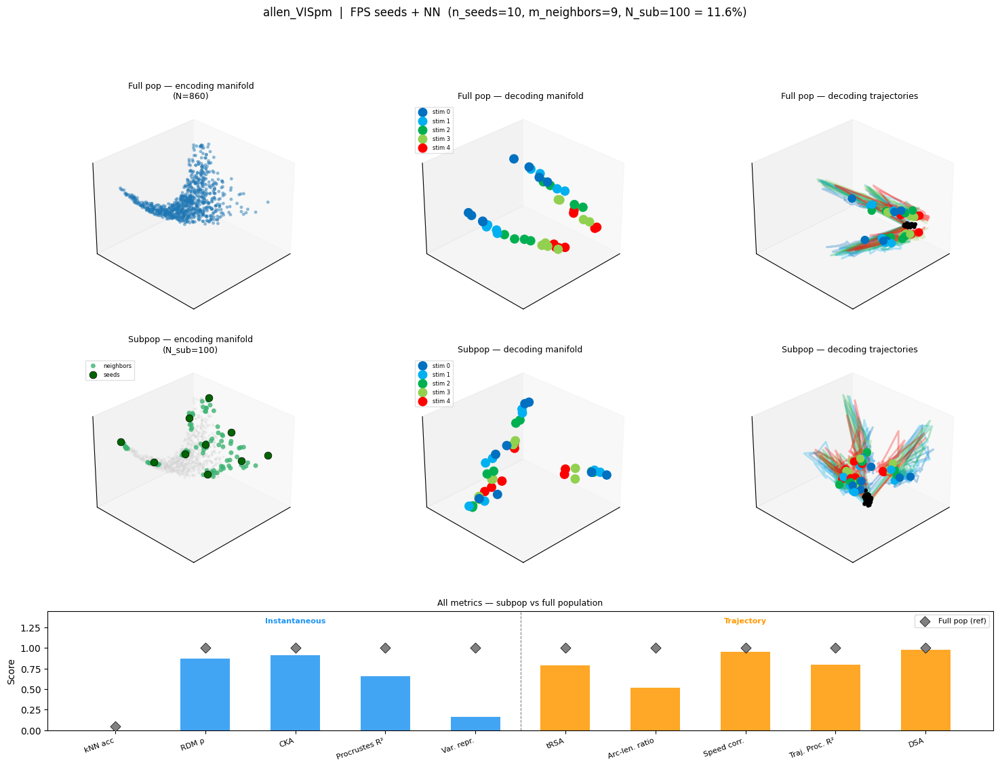

  Saved -> ../fig/subpop_critique/allen_VISpm_fps_n10_m9_combined.pdf

Loading allen_VISl...
../data/decompositions/allen_VISl-relNorm_sig3_n922-deepnet-shift*_F*.mat
F12: (5)
  Loaded in 2.4s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.025

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (10.9%)
  Inst:  kNN=0.000  RDM=0.735  CKA=0.915  R2=0.717  var=0.159
  Traj:  tRSA=0.675  ALR=0.575  SPC=0.961  tProc=0.731  DSA=0.960


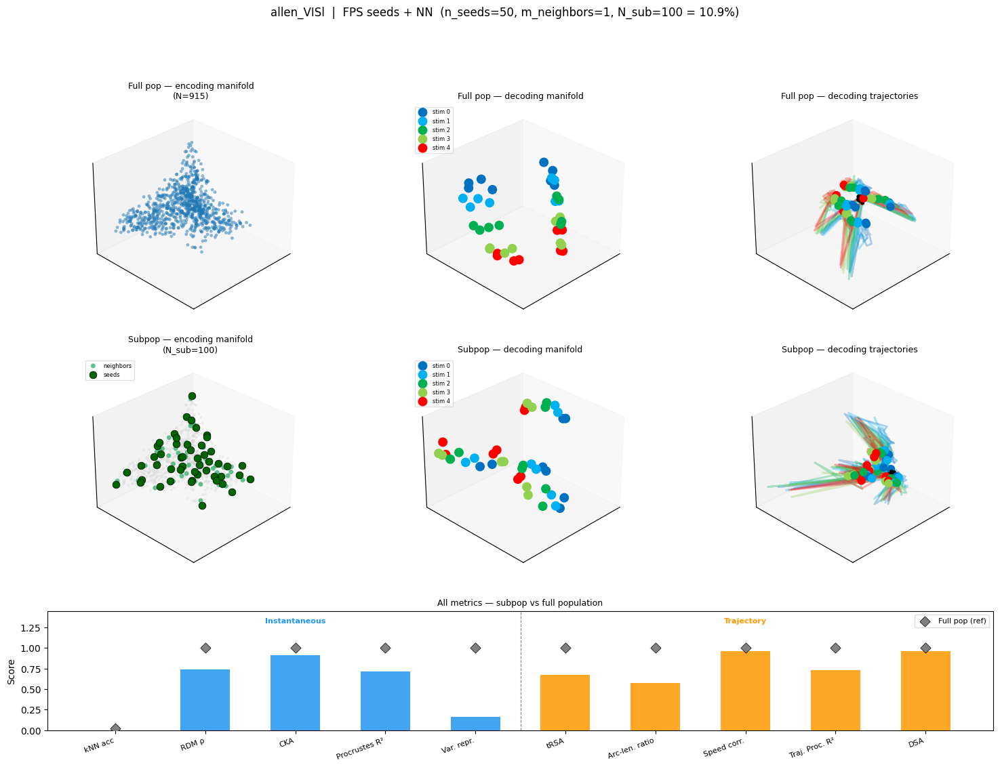

  Saved -> ../fig/subpop_critique/allen_VISl_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (10.9%)
  Inst:  kNN=0.025  RDM=0.781  CKA=0.902  R2=0.880  var=0.159
  Traj:  tRSA=0.728  ALR=0.594  SPC=0.956  tProc=0.793  DSA=0.943


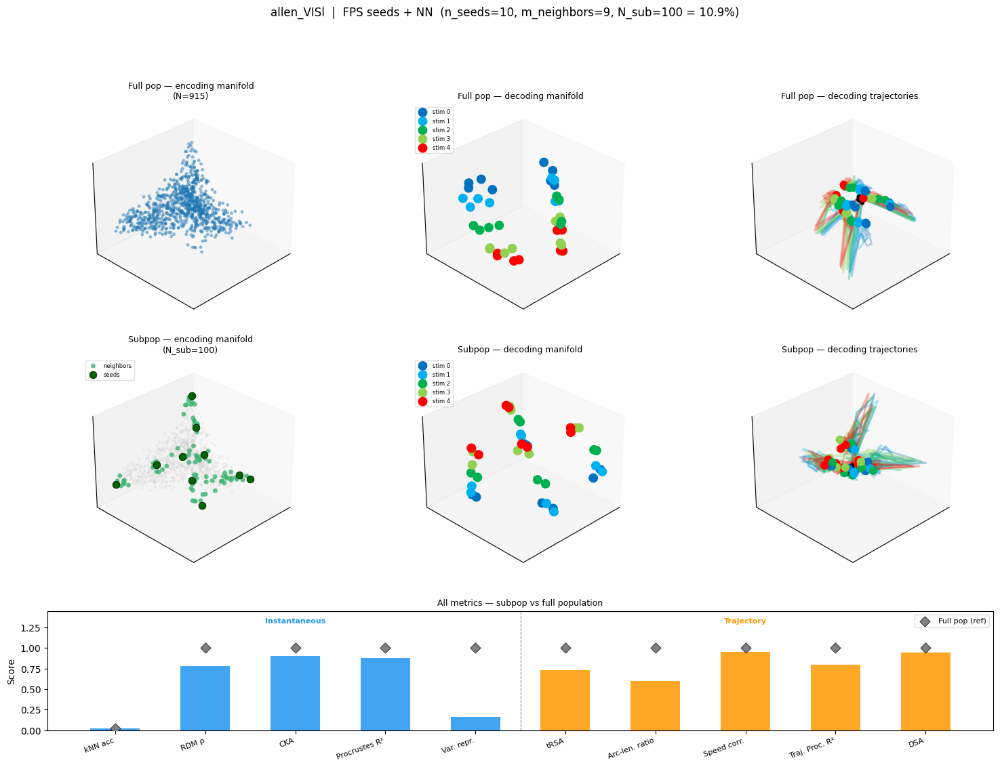

  Saved -> ../fig/subpop_critique/allen_VISl_fps_n10_m9_combined.pdf

Loading VISp_natural_movie_one_scenes_all156...
../data/decompositions/VISp_natural_movie_one_scenes_all156-relNorm_sig3_n2015-deepnet-shift*_F*.mat
F34: (30)
Shared neurons: 1261 of 2015 nat-movie, 1261 of 1261 manifold
VISp ext. manifold: 1261/1261 neurons matched
  Loaded in 13.1s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.000

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (5.0%)
  Inst:  kNN=0.000  RDM=0.887  CKA=0.905  R2=0.891  var=0.137
  Traj:  tRSA=0.832  ALR=0.529  SPC=0.562  tProc=0.671  DSA=0.978


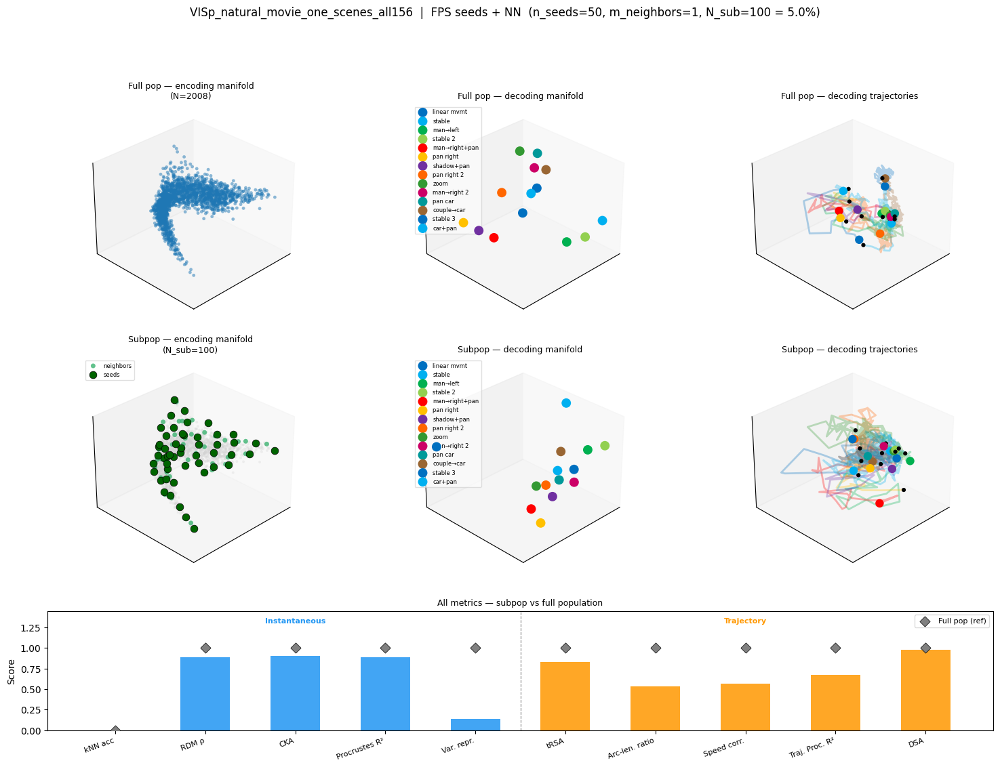

  Saved -> ../fig/subpop_critique/VISp_natural_movie_one_scenes_all156_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (5.0%)
  Inst:  kNN=0.000  RDM=0.877  CKA=0.897  R2=0.849  var=0.130
  Traj:  tRSA=0.760  ALR=0.481  SPC=0.621  tProc=0.718  DSA=0.968


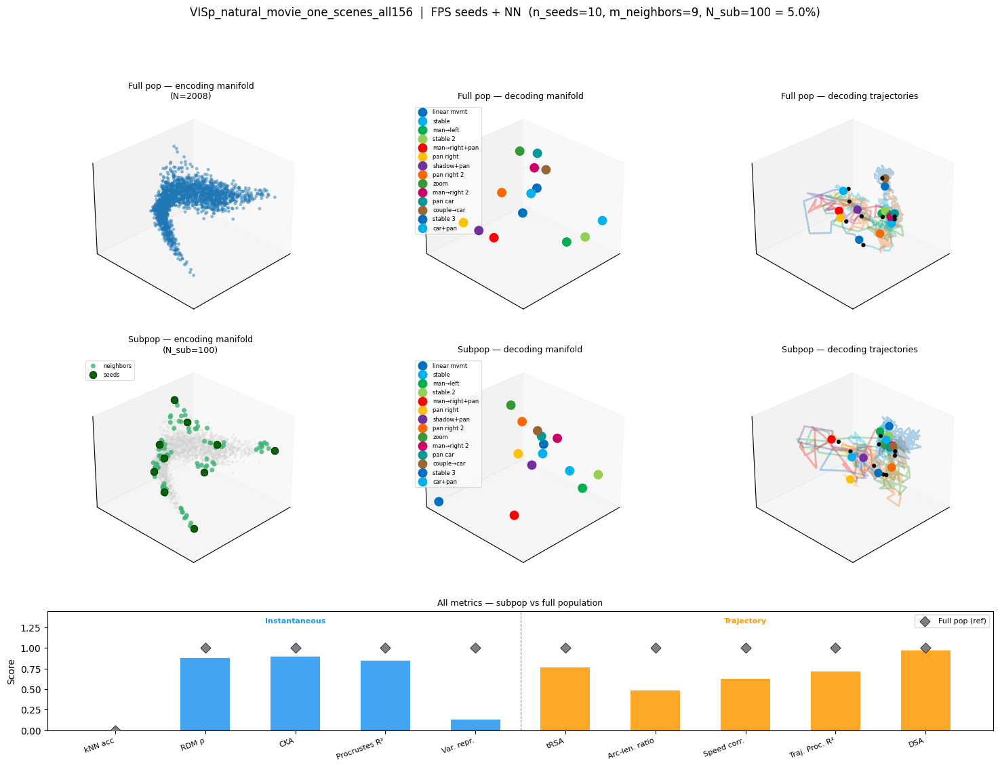

  Saved -> ../fig/subpop_critique/VISp_natural_movie_one_scenes_all156_fps_n10_m9_combined.pdf

Loading VISam_natural_movie_one_scenes_all156...
../data/decompositions/VISam_natural_movie_one_scenes_all156-relNorm_sig3_n1506-deepnet-shift*_F*.mat
F15: (5)
  Loaded in 4.5s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.000

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (6.7%)
  Inst:  kNN=0.000  RDM=0.887  CKA=0.936  R2=0.893  var=0.185
  Traj:  tRSA=0.886  ALR=0.743  SPC=0.590  tProc=0.688  DSA=0.975


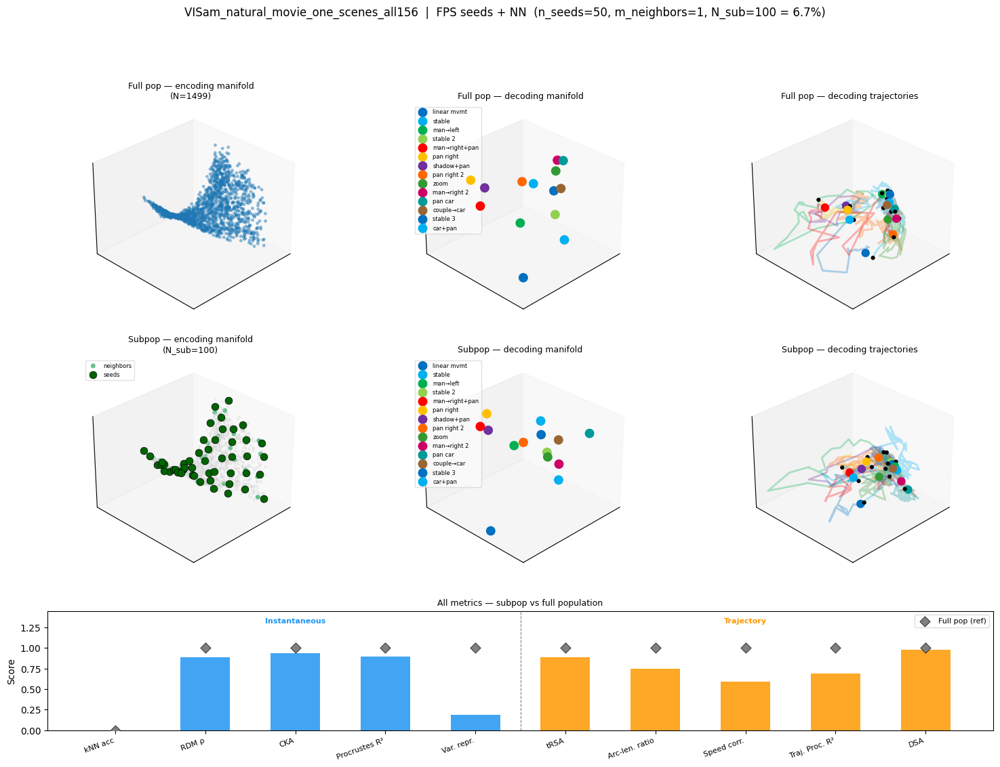

  Saved -> ../fig/subpop_critique/VISam_natural_movie_one_scenes_all156_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (6.7%)
  Inst:  kNN=0.000  RDM=0.928  CKA=0.948  R2=0.873  var=0.187
  Traj:  tRSA=0.909  ALR=0.704  SPC=0.522  tProc=0.661  DSA=0.940


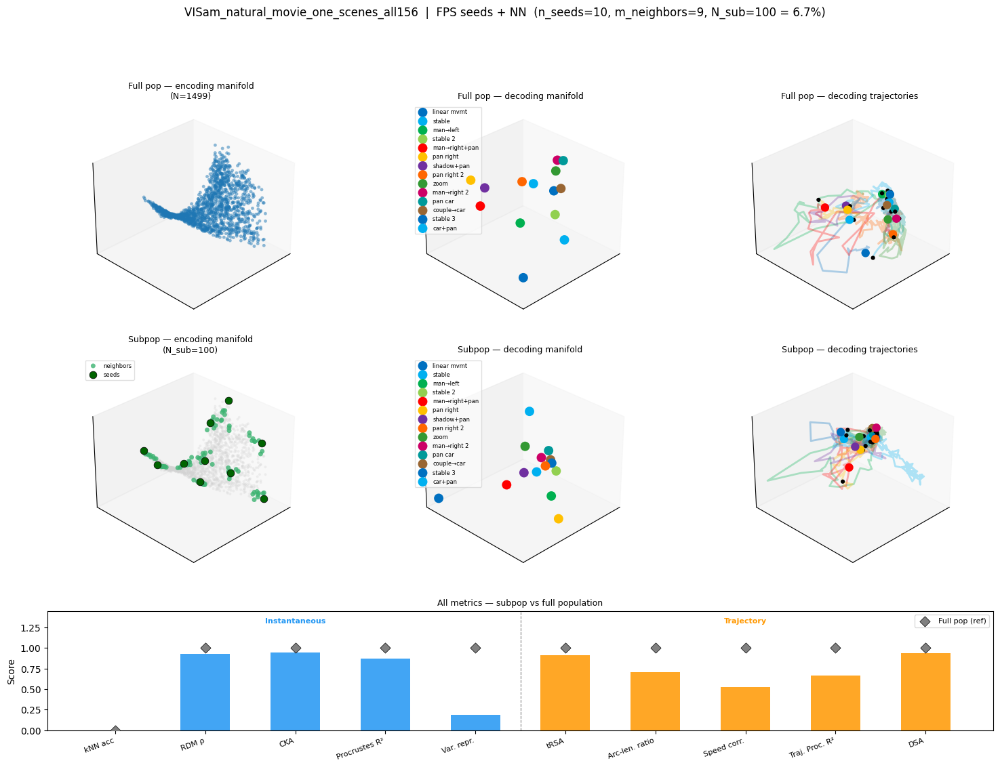

  Saved -> ../fig/subpop_critique/VISam_natural_movie_one_scenes_all156_fps_n10_m9_combined.pdf

Loading VISrl_natural_movie_one_scenes_all156...
../data/decompositions/VISrl_natural_movie_one_scenes_all156-relNorm_sig3_n1415-deepnet-shift*_F*.mat
F15: (5)
  Loaded in 4.9s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.000

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (7.1%)
  Inst:  kNN=0.000  RDM=0.964  CKA=0.968  R2=0.913  var=0.109
  Traj:  tRSA=0.918  ALR=0.563  SPC=0.366  tProc=0.559  DSA=0.930


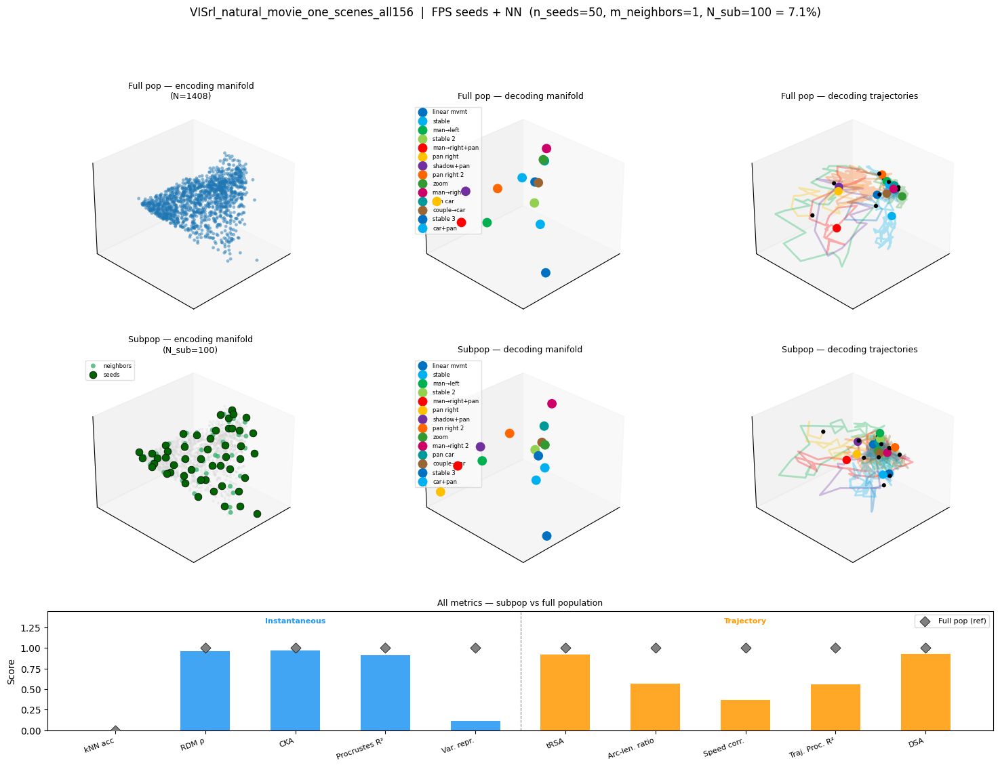

  Saved -> ../fig/subpop_critique/VISrl_natural_movie_one_scenes_all156_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (7.1%)
  Inst:  kNN=0.000  RDM=0.936  CKA=0.947  R2=0.795  var=0.165
  Traj:  tRSA=0.921  ALR=0.519  SPC=0.487  tProc=0.597  DSA=0.976


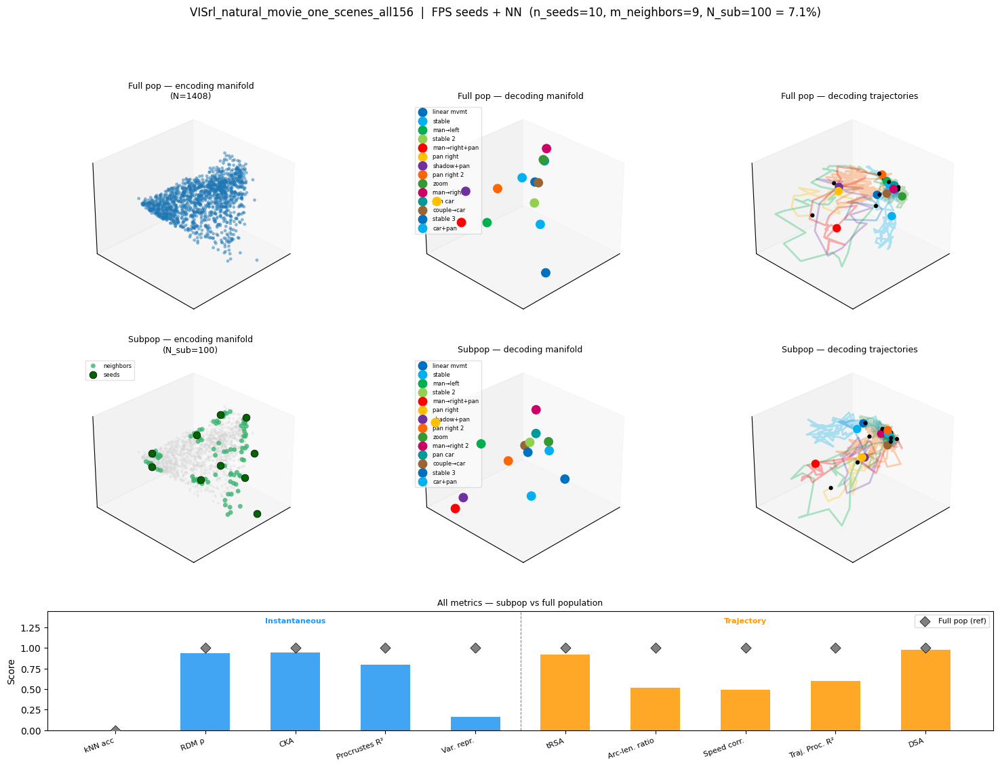

  Saved -> ../fig/subpop_critique/VISrl_natural_movie_one_scenes_all156_fps_n10_m9_combined.pdf

Loading VISpm_natural_movie_one_scenes_all156...
../data/decompositions/VISpm_natural_movie_one_scenes_all156-relNorm_sig3_n879-deepnet-shift*_F*.mat
F15: (5)
  Loaded in 2.1s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.000

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (11.5%)
  Inst:  kNN=0.000  RDM=0.881  CKA=0.922  R2=0.877  var=0.133
  Traj:  tRSA=0.809  ALR=0.769  SPC=0.587  tProc=0.659  DSA=0.979


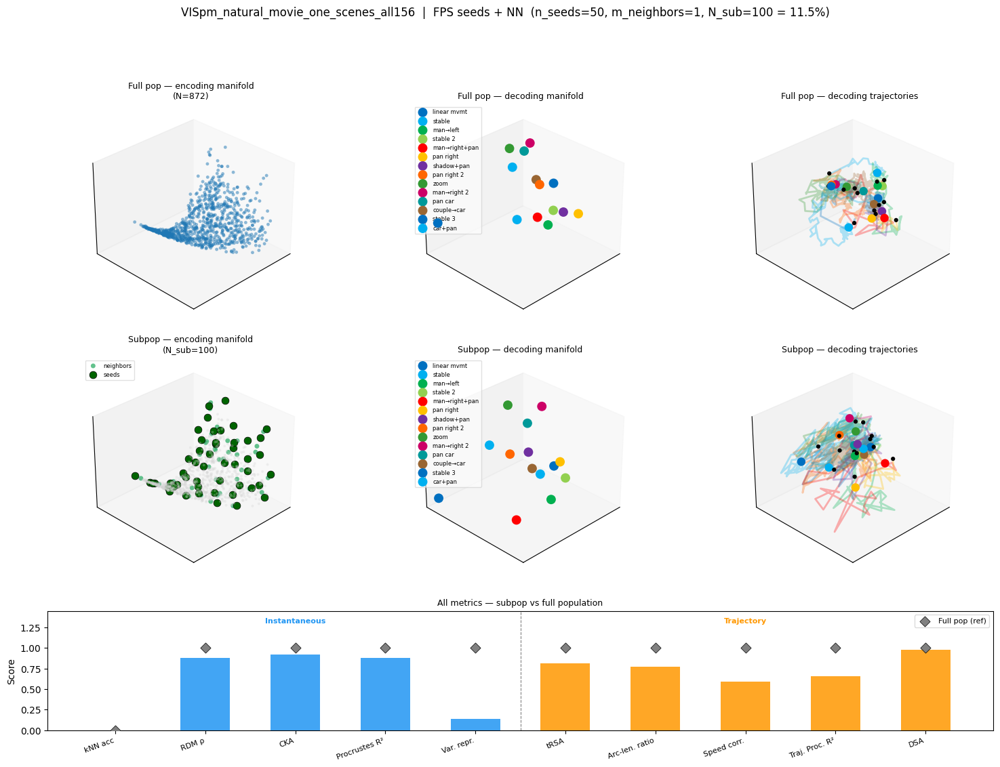

  Saved -> ../fig/subpop_critique/VISpm_natural_movie_one_scenes_all156_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (11.5%)
  Inst:  kNN=0.000  RDM=0.903  CKA=0.946  R2=0.925  var=0.221
  Traj:  tRSA=0.850  ALR=0.913  SPC=0.624  tProc=0.667  DSA=0.969


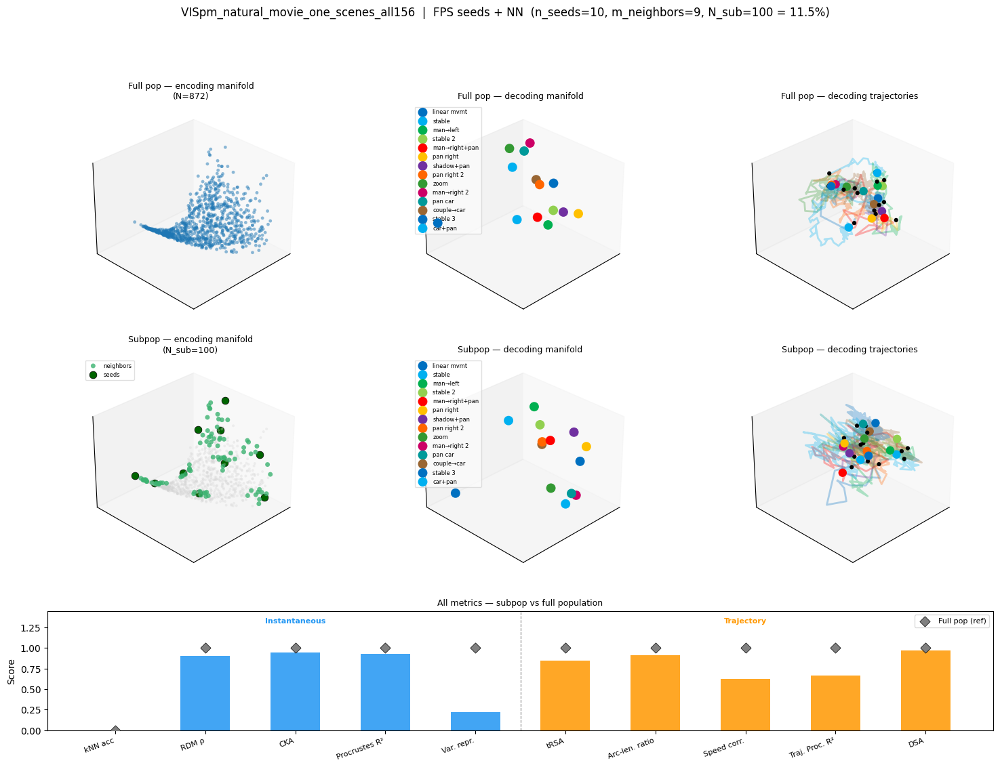

  Saved -> ../fig/subpop_critique/VISpm_natural_movie_one_scenes_all156_fps_n10_m9_combined.pdf

Loading VISl_natural_movie_one_scenes_all156...
../data/decompositions/VISl_natural_movie_one_scenes_all156-relNorm_sig3_n933-deepnet-shift*_F*.mat
F15: (5)
  Loaded in 2.4s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.000

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (10.8%)
  Inst:  kNN=0.000  RDM=0.895  CKA=0.925  R2=0.757  var=0.239
  Traj:  tRSA=0.817  ALR=0.668  SPC=0.575  tProc=0.695  DSA=0.992


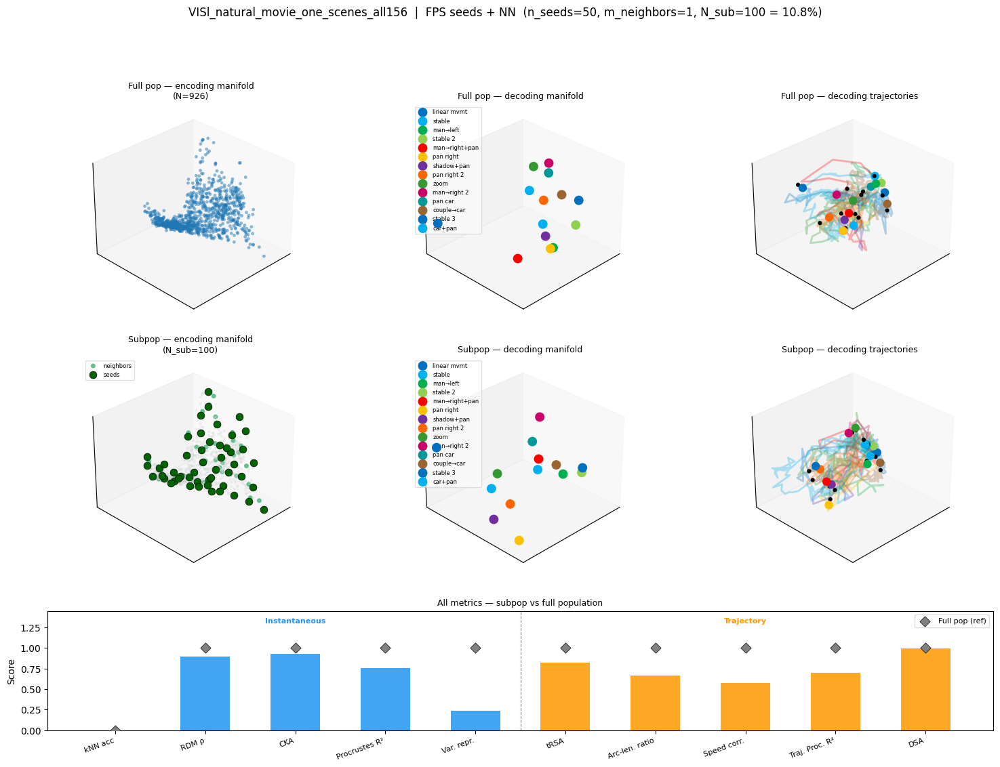

  Saved -> ../fig/subpop_critique/VISl_natural_movie_one_scenes_all156_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (10.8%)
  Inst:  kNN=0.000  RDM=0.886  CKA=0.929  R2=0.731  var=0.244
  Traj:  tRSA=0.834  ALR=0.748  SPC=0.550  tProc=0.579  DSA=0.973


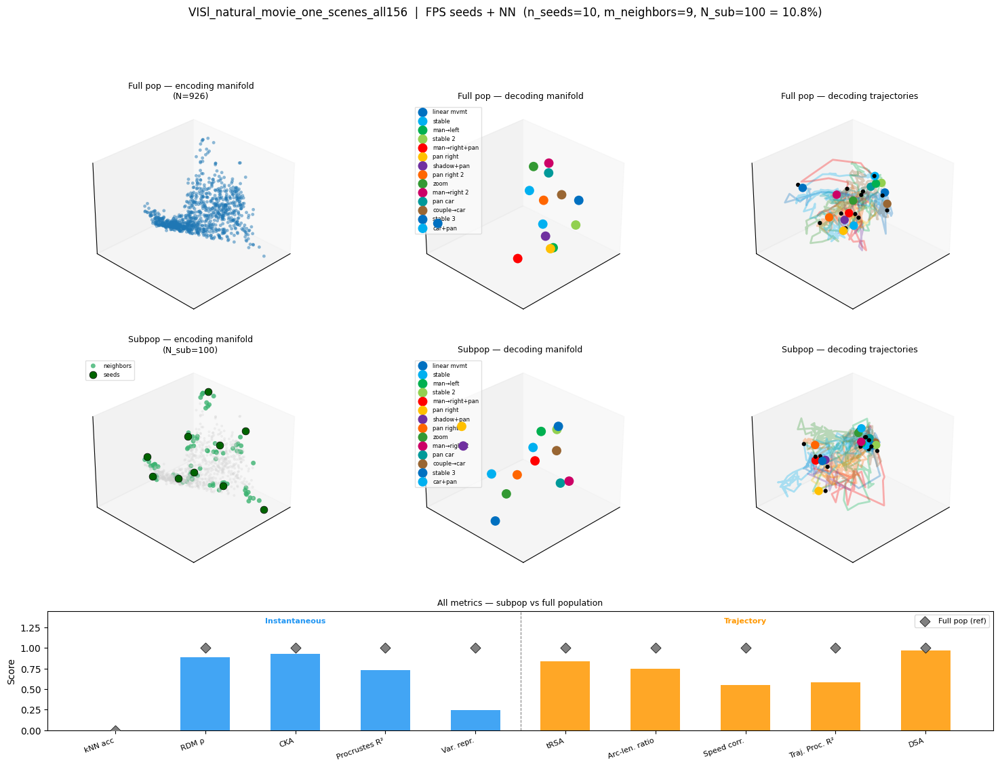

  Saved -> ../fig/subpop_critique/VISl_natural_movie_one_scenes_all156_fps_n10_m9_combined.pdf

Loading V1...
../data/decompositions/V1-relNorm_sig3_n637-deepnet-shift*_F*.mat
F17: (30)
  Loaded in 4.0s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.875

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (15.9%)
  Inst:  kNN=0.771  RDM=0.910  CKA=0.914  R2=0.722  var=0.199
  Traj:  tRSA=0.840  ALR=0.333  SPC=0.886  tProc=0.799  DSA=1.000


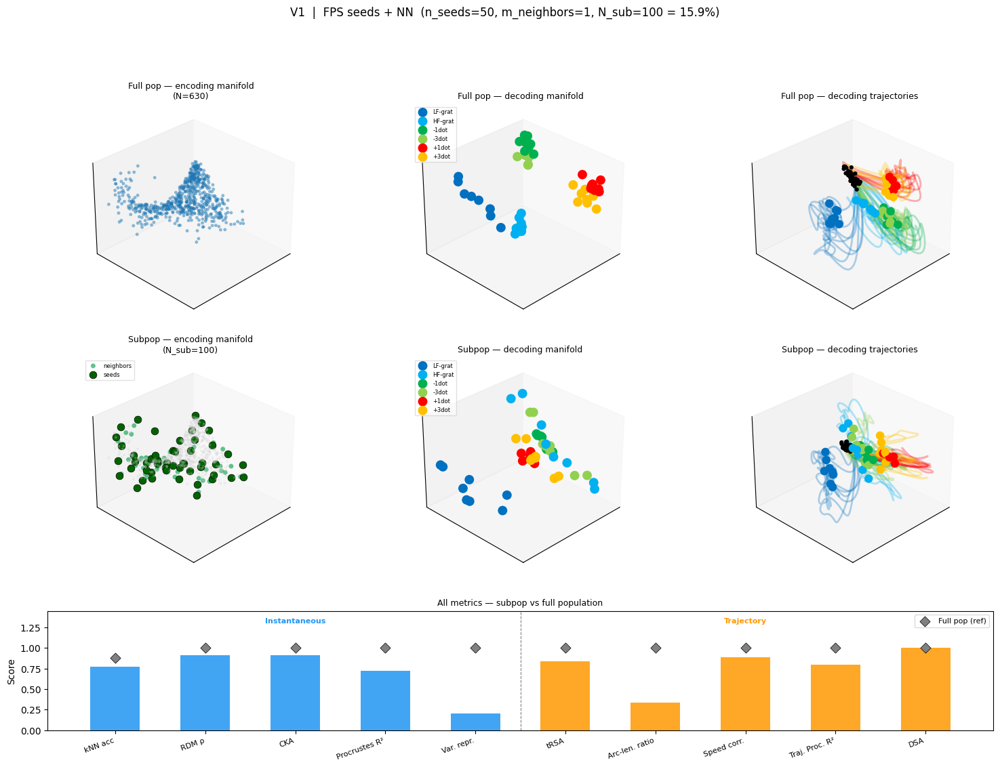

  Saved -> ../fig/subpop_critique/V1_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (15.9%)
  Inst:  kNN=0.688  RDM=0.940  CKA=0.919  R2=0.899  var=0.358
  Traj:  tRSA=0.914  ALR=0.878  SPC=0.806  tProc=0.693  DSA=1.000


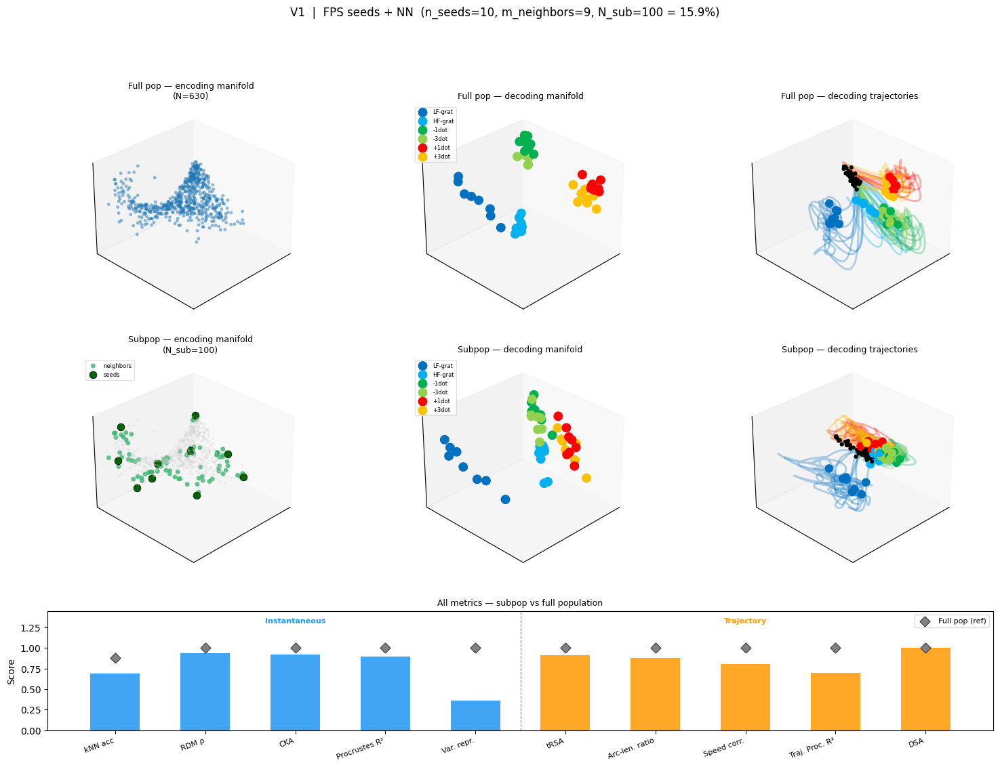

  Saved -> ../fig/subpop_critique/V1_fps_n10_m9_combined.pdf

Loading Retina...
../data/decompositions/Retina-relNorm_sig3_n1146-deepnet-shift*_F*.mat
F15: (5)
  Loaded in 86.2s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=1.000

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (8.8%)
  Inst:  kNN=0.875  RDM=0.747  CKA=0.948  R2=0.951  var=0.089
  Traj:  tRSA=0.862  ALR=0.438  SPC=0.948  tProc=0.934  DSA=1.000


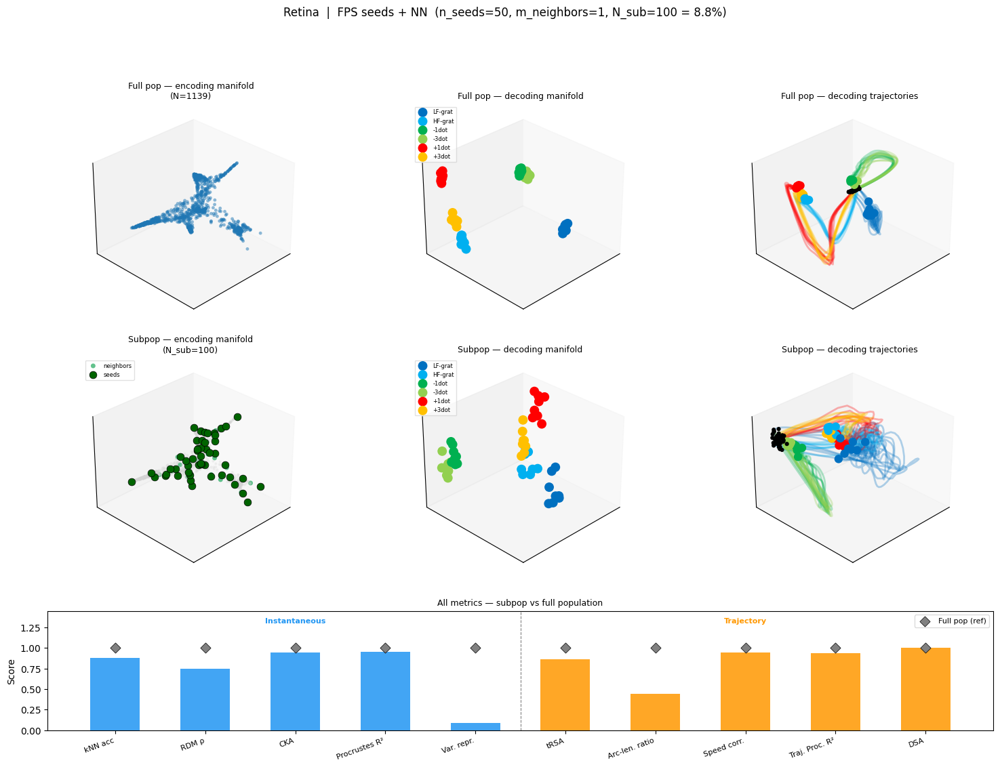

  Saved -> ../fig/subpop_critique/Retina_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (8.8%)
  Inst:  kNN=0.917  RDM=0.930  CKA=0.953  R2=0.961  var=0.080
  Traj:  tRSA=0.910  ALR=0.478  SPC=0.951  tProc=0.946  DSA=1.000


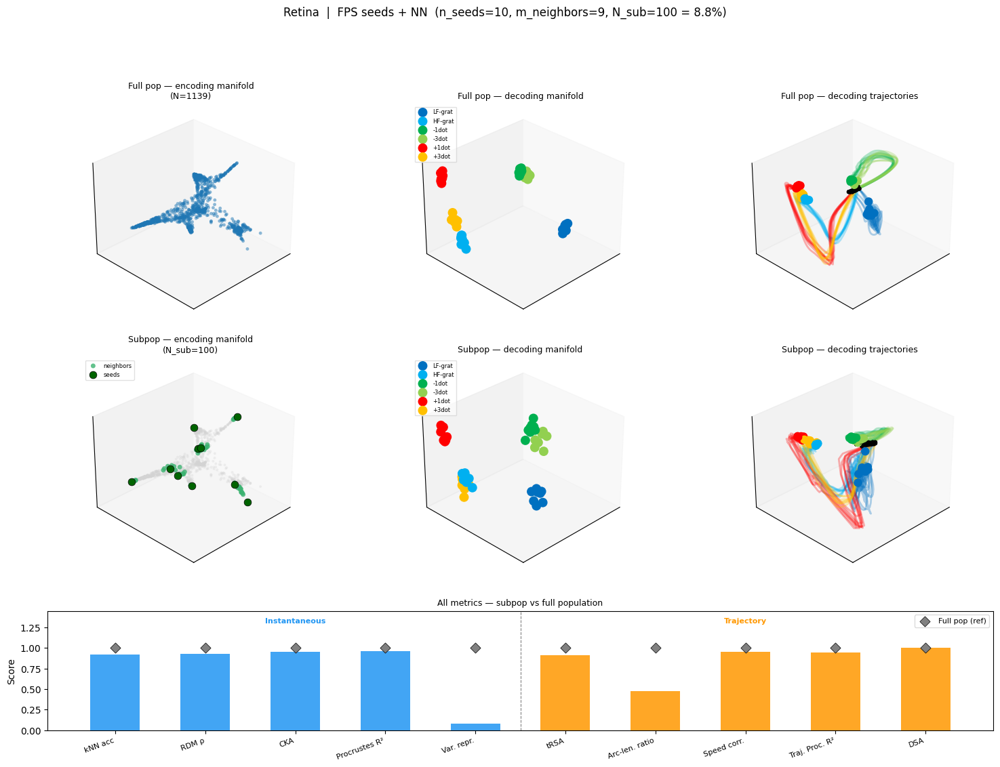

  Saved -> ../fig/subpop_critique/Retina_fps_n10_m9_combined.pdf

Loading fnn07_seed2...
../data/decompositions/fnn07_seed2-relNorm_sig3_n1000_SF-deepnet-shift*_F*.mat
F15: (5)
  Loaded in 4.0s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.771

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (10.1%)
  Inst:  kNN=0.625  RDM=0.845  CKA=0.935  R2=0.682  var=0.268
  Traj:  tRSA=0.766  ALR=0.310  SPC=0.969  tProc=0.942  DSA=0.991


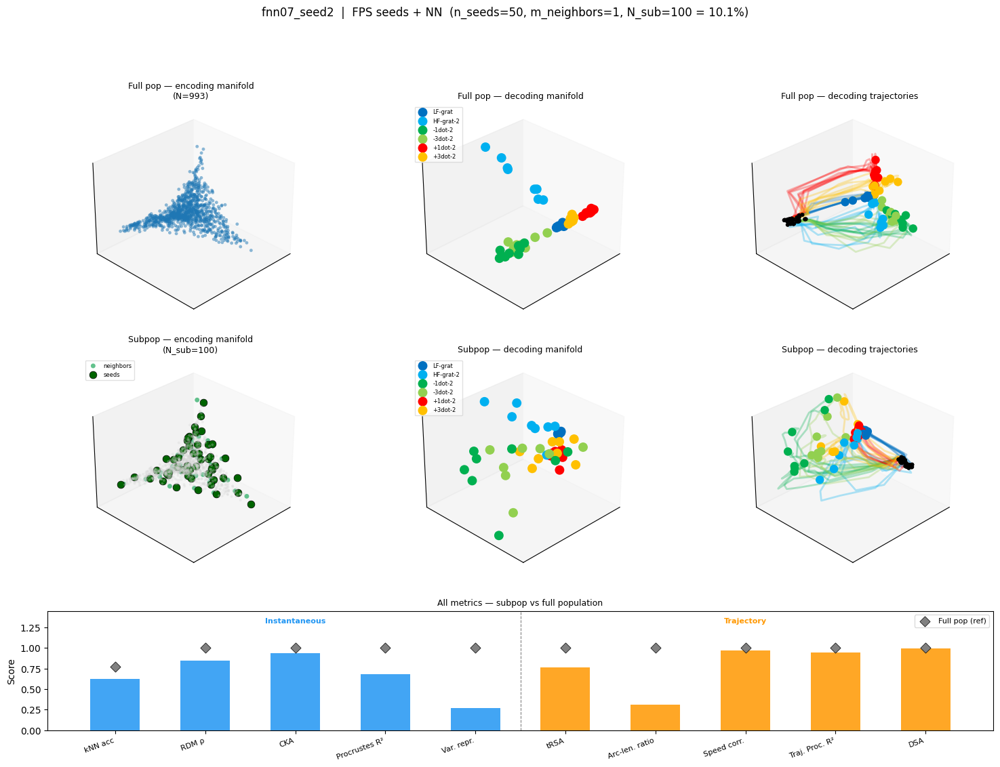

  Saved -> ../fig/subpop_critique/fnn07_seed2_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (10.1%)
  Inst:  kNN=0.729  RDM=0.889  CKA=0.945  R2=0.798  var=0.304
  Traj:  tRSA=0.800  ALR=0.375  SPC=0.963  tProc=0.913  DSA=0.989


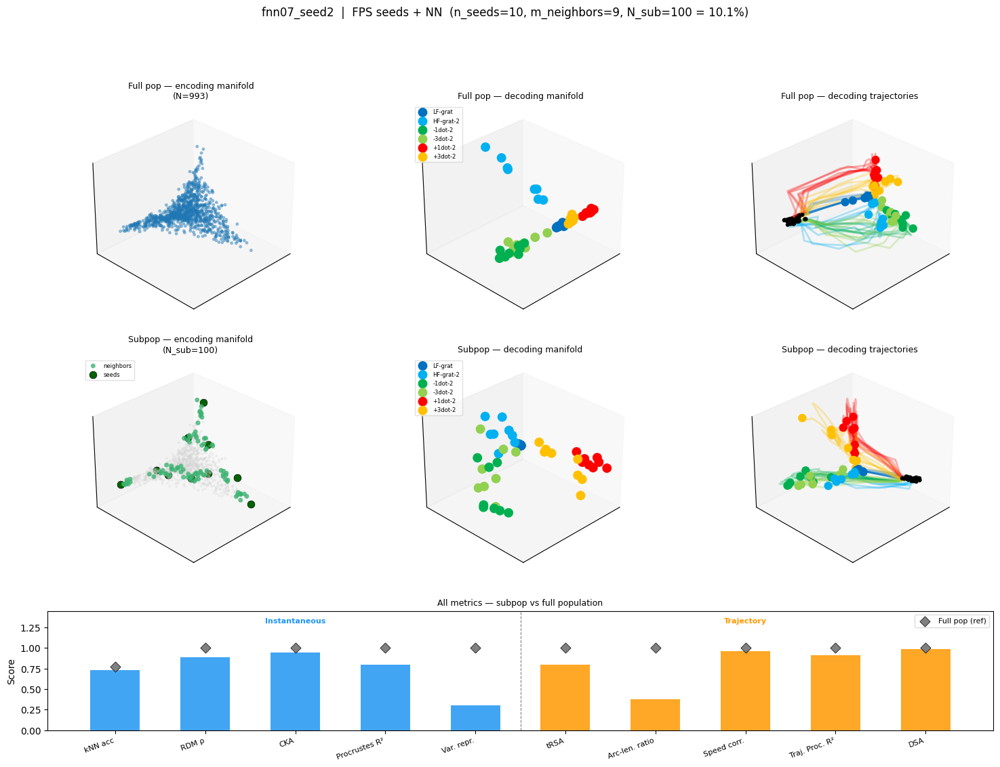

  Saved -> ../fig/subpop_critique/fnn07_seed2_fps_n10_m9_combined.pdf

Loading fnn07_act_i3_n2000_SCL0_7_TL37_hidden_maxFr_maxNr_seed1...
../data/decompositions/fnn07_act_i3_n2000_SCL0_7_TL37_hidden_maxFr_maxNr_seed1-relNorm_sig3_n2000_SF-deepnet-shift*_F*.mat
../data/decompositions/fnn07_act_i3_n2000_SCL0_7_TL37_hidden_maxFr_maxNr_seed1*_F*.mat
F10: (30)
  Loaded in 20.9s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.667

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (5.0%)
  Inst:  kNN=0.500  RDM=0.630  CKA=0.712  R2=0.689  var=0.165
  Traj:  tRSA=0.603  ALR=0.490  SPC=0.895  tProc=0.677  DSA=0.999


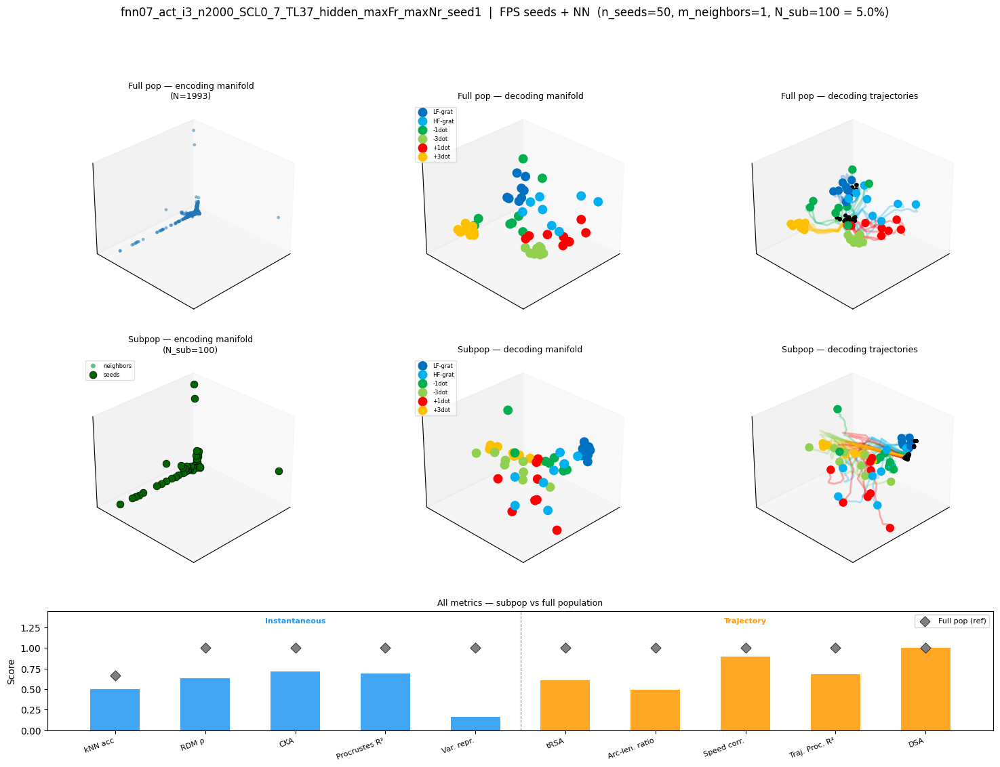

  Saved -> ../fig/subpop_critique/fnn07_act_i3_n2000_SCL0_7_TL37_hidden_maxFr_maxNr_seed1_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (5.0%)
  Inst:  kNN=0.292  RDM=0.563  CKA=0.601  R2=0.604  var=0.153
  Traj:  tRSA=0.541  ALR=0.479  SPC=0.882  tProc=0.545  DSA=0.999


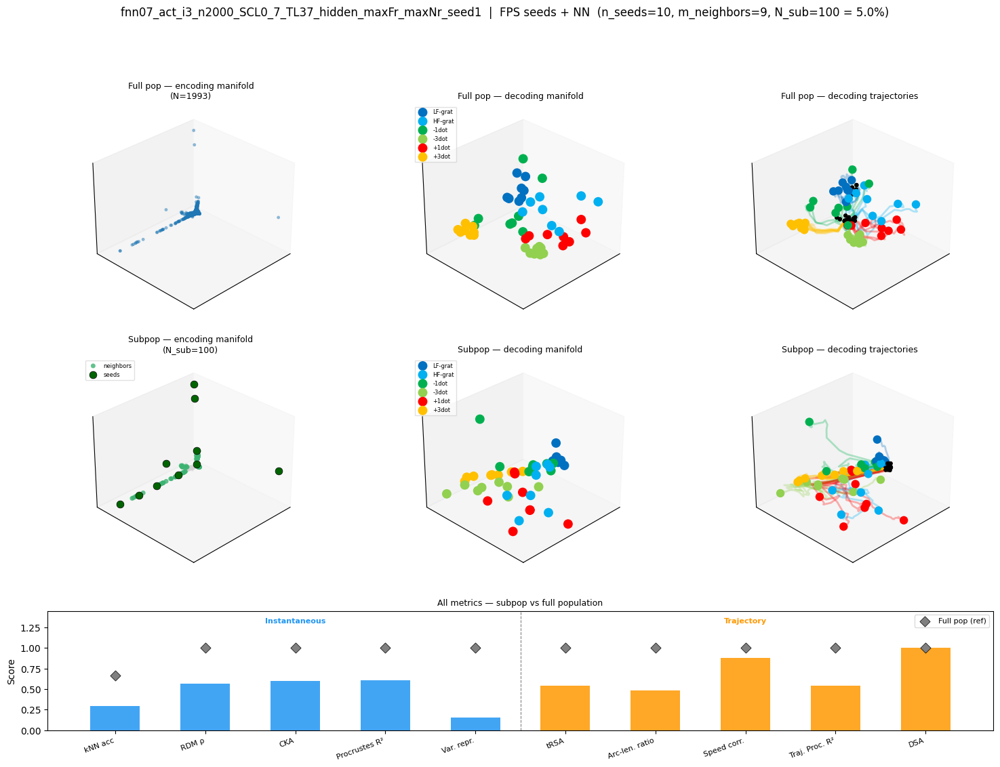

  Saved -> ../fig/subpop_critique/fnn07_act_i3_n2000_SCL0_7_TL37_hidden_maxFr_maxNr_seed1_fps_n10_m9_combined.pdf

Loading flyvis_T_Tm_i3_n1700_model000...
../data/decompositions/flyvis_T_Tm_i3_n1700_model000-relNorm_sig3_n1700_SF-deepnet-shift*_F*.mat
F11: (30)
  Loaded in 6.5s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.875

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (5.9%)
  Inst:  kNN=0.854  RDM=0.954  CKA=0.918  R2=0.812  var=0.067
  Traj:  tRSA=0.926  ALR=0.541  SPC=0.508  tProc=0.600  DSA=0.998


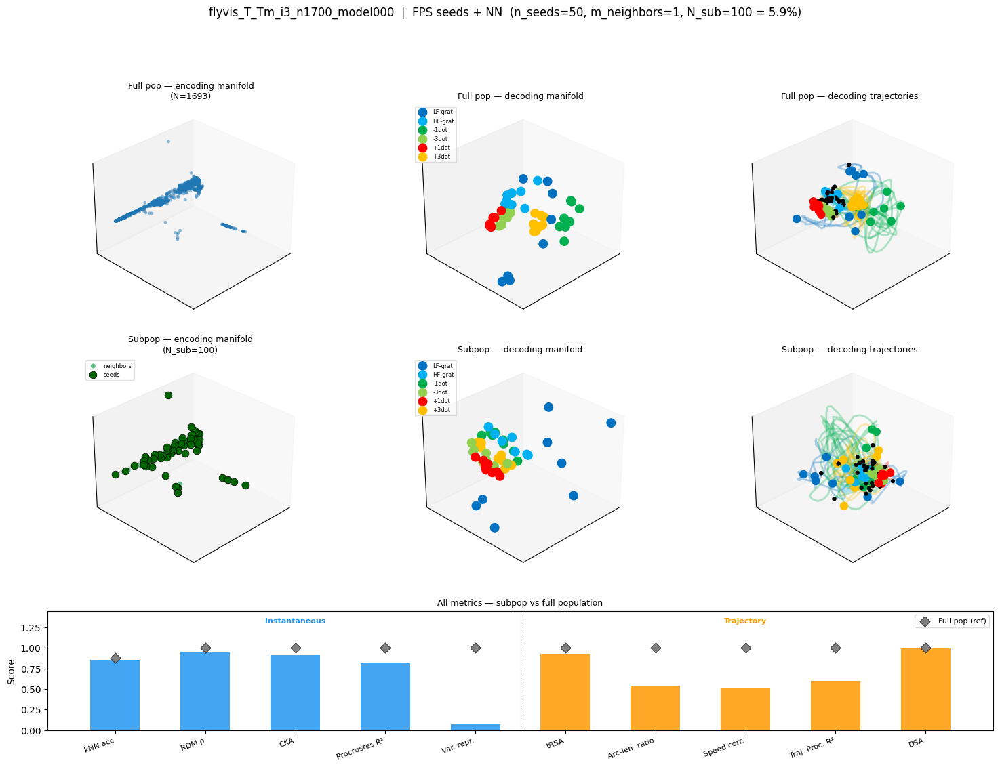

  Saved -> ../fig/subpop_critique/flyvis_T_Tm_i3_n1700_model000_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (5.9%)
  Inst:  kNN=0.792  RDM=0.904  CKA=0.839  R2=0.732  var=0.045
  Traj:  tRSA=0.900  ALR=0.491  SPC=0.450  tProc=0.598  DSA=0.994


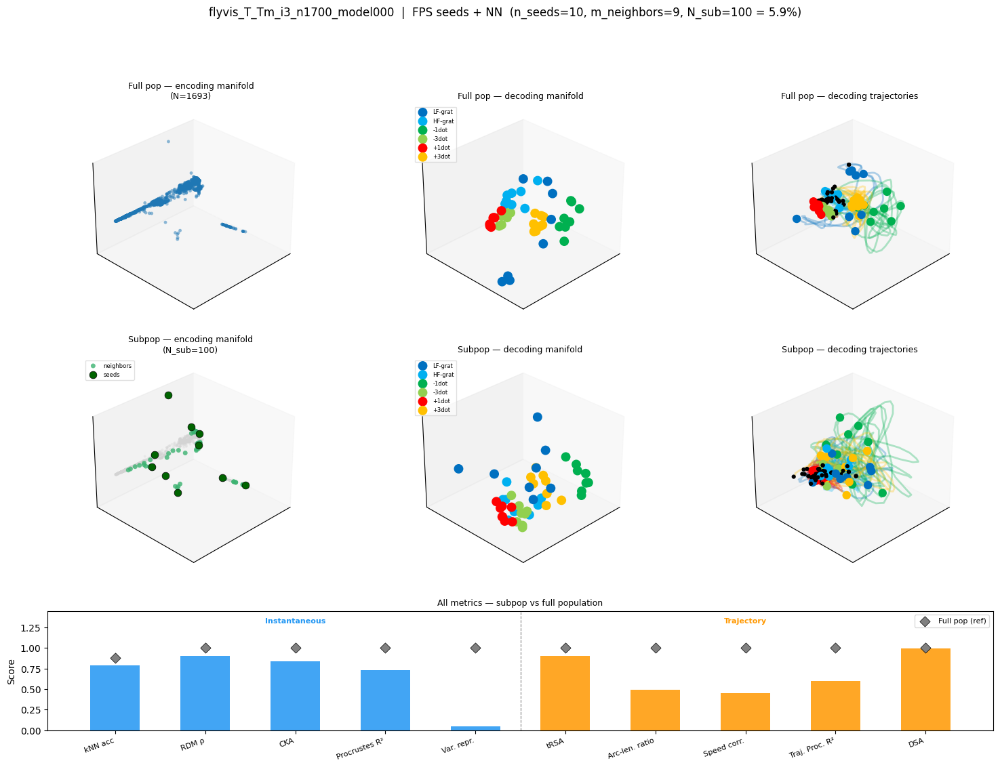

  Saved -> ../fig/subpop_critique/flyvis_T_Tm_i3_n1700_model000_fps_n10_m9_combined.pdf

Loading r2plus1d_layer4_i3_n1960_seed17...
../data/decompositions/r2plus1d_layer4_i3_n1960_seed17-relNorm_sig3_n1960_SF-deepnet-shift*_F*.mat
F15: (5)
  Loaded in 8.8s
  Computing full-pop decoding manifold + trajectories...
  Full-pop kNN=0.875

  -- N_SEEDS=50, M_NEIGHBORS=1 --
  Subpop: 100 neurons (5.1%)
  Inst:  kNN=0.792  RDM=0.803  CKA=0.919  R2=0.934  var=0.050
  Traj:  tRSA=0.823  ALR=0.265  SPC=0.591  tProc=0.785  DSA=0.995


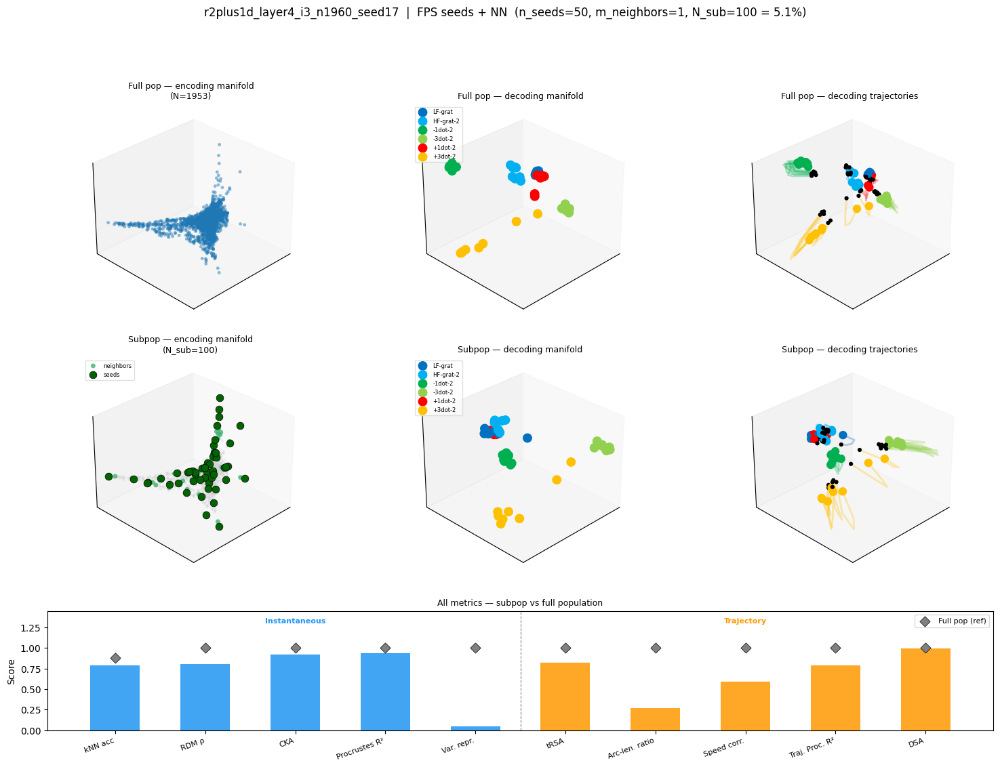

  Saved -> ../fig/subpop_critique/r2plus1d_layer4_i3_n1960_seed17_fps_n50_m1_combined.pdf

  -- N_SEEDS=10, M_NEIGHBORS=9 --
  Subpop: 100 neurons (5.1%)
  Inst:  kNN=0.917  RDM=0.705  CKA=0.847  R2=0.812  var=0.068
  Traj:  tRSA=0.722  ALR=0.371  SPC=0.574  tProc=0.736  DSA=0.985


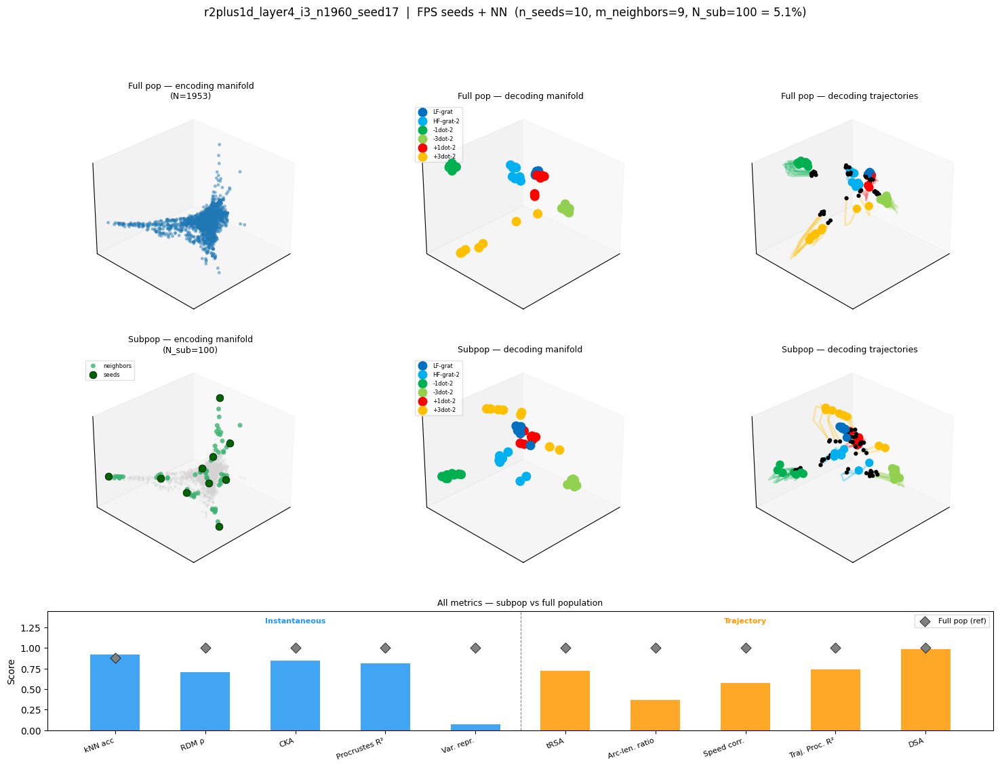

  Saved -> ../fig/subpop_critique/r2plus1d_layer4_i3_n1960_seed17_fps_n10_m9_combined.pdf

LaTeX table written -> ../fig/subpop_critique/sweep_results.md

% Auto-generated by notebook 20, cell 8
\begin{table}[h]
\centering
\small
\caption{FPS seeds + NN subpopulation metrics across datasets and settings.}
\label{tab:fps_sweep}
\begin{tabular}{l r r r | r r r r r | r r r r r}
\toprule
Prefix & $n$ & $m$ & $N_\text{sub}$ & kNN & RDM $\rho$ & CKA & Proc.\ $R^2$ & Var. & tRSA & ALR & SPC & tProc & DSA \\
\midrule
allen\_VISp & 50 & 1 & 100 & 0.125 & 0.931 & 0.953 & 0.954 & 0.043 & 0.795 & 0.339 & 0.806 & 0.485 & 0.957 \\
 & 10 & 9 & 100 & 0.000 & 0.803 & 0.896 & 0.676 & 0.091 & 0.714 & 0.472 & 0.928 & 0.707 & 0.961 \\
allen\_VISrl & 50 & 1 & 100 & 0.000 & 0.851 & 0.937 & 0.899 & 0.087 & 0.682 & 0.593 & 0.940 & 0.598 & 0.955 \\
 & 10 & 9 & 100 & 0.075 & 0.805 & 0.907 & 0.921 & 0.077 & 0.653 & 0.717 & 0.927 & 0.588 & 0.896 \\
allen\_VISam & 50 & 1 & 100 & 0.200 & 0.832 & 0.867 & 0.870 & 0.08

In [17]:
## 8 — Section 7 sweep: multiple prefixes × two FPS-seed settings

# ── CONFIGURE ────────────────────────────────────────────────────────────────
PREFIXES_SWEEP = [
    'allen_VISp', 
    'allen_VISrl', 
    'allen_VISam', 
    'allen_VISpm', 
    'allen_VISl', 
    'VISp_natural_movie_one_scenes_all156', 
    'VISam_natural_movie_one_scenes_all156', 
    'VISrl_natural_movie_one_scenes_all156', 
    'VISpm_natural_movie_one_scenes_all156', 
    'VISl_natural_movie_one_scenes_all156', 
    'V1', 
    'Retina',
    'fnn07_seed2',
    'fnn07_act_i3_n2000_SCL0_7_TL37_hidden_maxFr_maxNr_seed1',
    'flyvis_T_Tm_i3_n1700_model000',
    'r2plus1d_layer4_i3_n1960_seed17'
]

SETTINGS_SWEEP = [
    dict(N_SEEDS=50, M_NEIGHBORS=1),
    dict(N_SEEDS=10, M_NEIGHBORS=9),
]

RNG_SEED_SWEEP = 42
# ─────────────────────────────────────────────────────────────────────────────

from scipy.spatial.distance import cdist as _cdist2
from matplotlib.gridspec import GridSpec

_ALL_M_LABELS = ['kNN acc', 'RDM \u03c1', 'CKA', 'Procrustes R\u00b2', 'Var. repr.',
                 'tRSA', 'Arc-len. ratio', 'Speed corr.', 'Traj. Proc. R\u00b2', 'DSA']
_BAR_COLS     = ['#2196F3'] * 5 + ['#FF9800'] * 5


# ── panel helpers ────────────────────────────────────────────────────────────
def _panel_enc_full(ax, emb):
    ax.scatter(*emb.T[:3], c='#1f77b4', s=12, alpha=0.5,
               edgecolors='none', depthshade=False)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
    ax.view_init(elev=30, azim=45)


def _panel_enc_sub(ax, emb, mask_sub, mask_seeds):
    ax.scatter(*emb[~mask_sub].T[:3], c='lightgray', s=8, alpha=0.3,
               edgecolors='none', depthshade=False)
    ax.scatter(*emb[mask_sub & ~mask_seeds].T[:3], c='mediumseagreen', s=25, alpha=0.8,
               edgecolors='none', depthshade=False, label='neighbors')
    ax.scatter(*emb[mask_seeds].T[:3], c='darkgreen', s=60, alpha=1.0,
               edgecolors='black', linewidths=0.5, depthshade=False, label='seeds')
    ax.legend(fontsize=6, loc='upper left', framealpha=0.6)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
    ax.view_init(elev=30, azim=45)


def _panel_dec_manifold(ax, coords, sl, NS, stim_names, sc):
    for si in range(NS):
        sel = sl == si
        lbl = stim_names[si] if si < len(stim_names) else f's{si}'
        ax.scatter(coords[sel, 0], coords[sel, 1], coords[sel, 2],
                   c=sc[si % len(sc)], s=100, alpha=1.0,
                   edgecolors='none', depthshade=False, label=lbl)
    ax.legend(fontsize=6, loc='upper left', framealpha=0.6)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
    ax.view_init(elev=30, azim=45)


def _panel_trajs(ax, trajs, ND, sc):
    for i, traj in enumerate(trajs):
        col = sc[(i // ND) % len(sc)]
        valid = ~np.any(np.isnan(traj), axis=1)
        tv = traj[valid]
        if len(tv) < 2:
            continue
        ax.plot(tv[:, 0], tv[:, 1], tv[:, 2], color=col, lw=2, alpha=0.3)
        ax.scatter(tv[0, 0], tv[0, 1], tv[0, 2],
                   color='black', s=20, edgecolors='none', depthshade=False)
        ax.scatter(tv[-1, 0], tv[-1, 1], tv[-1, 2],
                   color=col, s=80, edgecolors='none', depthshade=False)
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
    ax.view_init(elev=30, azim=45)
# ─────────────────────────────────────────────────────────────────────────────

_all_results = []   # accumulated for LaTeX table

for pfx in PREFIXES_SWEEP:
    print(f'\n{"="*65}')
    print(f'Loading {pfx}...')
    t0 = time.time()
    _d = load_for_explorer(pfx)
    print(f'  Loaded in {time.time()-t0:.1f}s')

    _emb        = _d['embedding_']
    _t4d        = _d['tensor4d_raw'].transpose(0, 1, 3, 2)
    _ND         = _d['NDIRS']

    # For 11-stim datasets (FNN/FlyVis/CORnet/MouseNet/R(2+1)D), select 6 stimuli
    # by population-level SF majority vote — mirrors build.py / cell 3 logic.
    if _t4d.shape[1] == 11:
        _stim11_labels = ['LF-grat', 'HF-grat', '-1dot', '-3dot', '+1dot', '+3dot',
                          'HF-grat-2', '-1dot-2', '-3dot-2', '+1dot-2', '+3dot-2']
        _chosen_idx, _t4d = select_sf_stims_for_decoding(_t4d)
        _stim_names = [_stim11_labels[i] for i in _chosen_idx]
        #print(f'  SF selection ('{'low' if _chosen_idx == list(range(6)) else 'high'}') → {_chosen_idx}')
    else:
        _stim_names = _d['my_stims']

    _NS         = _t4d.shape[1]          # 6 after SF selection, unchanged otherwise
    _N          = len(_emb)
    _sc         = (_PALETTE * math.ceil(_NS / len(_PALETTE)))[:_NS]
    _sl         = np.repeat(np.arange(_NS), _ND)

    print('  Computing full-pop decoding manifold + trajectories...')
    _cf, _    = compute_decoding_manifold(_t4d)
    _tf, _    = compute_decoding_trajectories(_t4d)
    _acc_full = knn_decoding_accuracy(_cf, _sl)
    print(f'  Full-pop kNN={_acc_full:.3f}')

    for sett in SETTINGS_SWEEP:
        N_S = sett['N_SEEDS']
        M_N = sett['M_NEIGHBORS']
        tag = f'{pfx}_fps_n{N_S}_m{M_N}'
        print(f'\n  -- N_SEEDS={N_S}, M_NEIGHBORS={M_N} --')

        # Farthest-point sampling
        rng_sw = np.random.default_rng(RNG_SEED_SWEEP)
        emb3   = _emb[:, :3]
        pw     = _cdist2(emb3, emb3)
        fps    = [int(rng_sw.integers(_N))]
        md     = pw[fps[0]].copy()
        for _ in range(1, min(N_S, _N)):
            nxt = int(np.argmax(md))
            fps.append(nxt)
            md = np.minimum(md, pw[nxt])
        seed_idx = np.array(fps)

        # Nearest-neighbor expansion
        sel_set = set(seed_idx.tolist())
        d2s = _cdist2(_emb, _emb[seed_idx])
        for si in range(len(seed_idx)):
            nn_ord = np.argsort(d2s[:, si])
            cnt = 0
            for j in nn_ord:
                if j in sel_set:
                    continue
                sel_set.add(j)
                cnt += 1
                if cnt >= M_N:
                    break
        idx_sub  = np.array(sorted(sel_set))
        t_sub    = _t4d[idx_sub]
        n_sub    = len(idx_sub)
        print(f'  Subpop: {n_sub} neurons ({100*n_sub/_N:.1f}%)')

        mask_sub   = np.zeros(_N, dtype=bool); mask_sub[idx_sub]   = True
        mask_seeds = np.zeros(_N, dtype=bool); mask_seeds[seed_idx] = True

        _cs, _ = compute_decoding_manifold(t_sub)
        _ts, _ = compute_decoding_trajectories(t_sub)

        _acc  = knn_decoding_accuracy(_cs, _sl)
        _rdm  = rdm_correlation(_t4d, t_sub)
        _cka  = linear_cka(_t4d, t_sub)
        _r2   = procrustes_r2(_cf, _cs)
        _var  = variance_reproduced(_cf, _cs)

        _trsa_p, _trsa = time_resolved_rsa(_t4d, t_sub)
        _alr,  _       = trajectory_arclength_ratio(_tf, _ts)
        _spc,  _       = speed_profile_correlation(_tf, _ts)
        _tprc, _       = trajectory_procrustes_r2(_tf, _ts)
        _dsa           = compute_dsa_sweep(_t4d, t_sub)

        _sub_all  = [_acc,  _rdm,  _cka,  _r2,   _var,
                     _trsa, _alr,  _spc,  _tprc, _dsa]
        _full_all = [_acc_full, 1.0, 1.0, 1.0, 1.0,
                     1.0,       1.0, 1.0, 1.0, 1.0]

        _all_results.append(dict(
            prefix=pfx, N=_N, n_seeds=N_S, m_neighbors=M_N, n_sub=n_sub,
            acc=_acc, rdm=_rdm, cka=_cka, r2=_r2, var=_var,
            trsa=_trsa, alr=_alr, spc=_spc, tprc=_tprc, dsa=_dsa,
        ))

        _dsa_s = f'{_dsa:.3f}' if _dsa is not None and not np.isnan(_dsa) else 'nan'
        print(f'  Inst:  kNN={_acc:.3f}  RDM={_rdm:.3f}  CKA={_cka:.3f}  R2={_r2:.3f}  var={_var:.3f}')
        print(f'  Traj:  tRSA={_trsa:.3f}  ALR={_alr:.3f}  SPC={_spc:.3f}  tProc={_tprc:.3f}  DSA={_dsa_s}')

        # 3-row combined figure
        fig_main = plt.figure(figsize=(18, 12))
        fig_main.suptitle(
            f'{pfx}  |  FPS seeds + NN  (n_seeds={N_S}, m_neighbors={M_N}, '
            f'N_sub={n_sub} = {100*n_sub/_N:.1f}%)',
            fontsize=12, y=1.00)

        gs = GridSpec(3, 3, figure=fig_main, hspace=0.2, wspace=0.15,
                      height_ratios=[1, 1, 0.55])

        # Row 0 — full population
        ax0_enc = fig_main.add_subplot(gs[0, 0], projection='3d')
        _panel_enc_full(ax0_enc, _emb)
        ax0_enc.set_title(f'Full pop \u2014 encoding manifold\n(N={_N})', fontsize=9)

        ax0_dec = fig_main.add_subplot(gs[0, 1], projection='3d')
        _panel_dec_manifold(ax0_dec, _cf, _sl, _NS, _stim_names, _sc)
        ax0_dec.set_title('Full pop \u2014 decoding manifold', fontsize=9)

        ax0_trj = fig_main.add_subplot(gs[0, 2], projection='3d')
        _panel_trajs(ax0_trj, _tf, _ND, _sc)
        ax0_trj.set_title('Full pop \u2014 decoding trajectories', fontsize=9)

        # Row 1 — subpopulation
        ax1_enc = fig_main.add_subplot(gs[1, 0], projection='3d')
        _panel_enc_sub(ax1_enc, _emb, mask_sub, mask_seeds)
        ax1_enc.set_title(f'Subpop \u2014 encoding manifold\n(N_sub={n_sub})', fontsize=9)

        ax1_dec = fig_main.add_subplot(gs[1, 1], projection='3d')
        _panel_dec_manifold(ax1_dec, _cs, _sl, _NS, _stim_names, _sc)
        ax1_dec.set_title('Subpop \u2014 decoding manifold', fontsize=9)

        ax1_trj = fig_main.add_subplot(gs[1, 2], projection='3d')
        _panel_trajs(ax1_trj, _ts, _ND, _sc)
        ax1_trj.set_title('Subpop \u2014 decoding trajectories', fontsize=9)

        # Row 2 — all 10 metrics
        ax_met = fig_main.add_subplot(gs[2, :])
        x_m = np.arange(len(_ALL_M_LABELS))
        ax_met.bar(x_m, _sub_all, 0.55, color=_BAR_COLS, alpha=0.85, zorder=2)
        ax_met.scatter(x_m, _full_all, marker='D', s=60, c='gray', zorder=3,
                       edgecolors='black', linewidths=0.5, label='Full pop (ref)')
        ax_met.axvline(4.5, color='k', lw=0.8, ls='--', alpha=0.5)
        ax_met.text(2.0, 1.30, 'Instantaneous', ha='center', fontsize=8,
                    color='#2196F3', fontweight='bold')
        ax_met.text(7.0, 1.30, 'Trajectory', ha='center', fontsize=8,
                    color='#FF9800', fontweight='bold')
        ax_met.set_xticks(x_m)
        ax_met.set_xticklabels(_ALL_M_LABELS, fontsize=8, rotation=20, ha='right')
        ax_met.set_ylabel('Score')
        ax_met.set_ylim(0, 1.45)
        ax_met.legend(fontsize=8, framealpha=0.7, loc='upper right')
        ax_met.set_title('All metrics \u2014 subpop vs full population', fontsize=9)

        plt.tight_layout()
        save_path = f'{BASEDIR_FIG}/{tag}_combined.pdf'
        plt.savefig(save_path, bbox_inches='tight')
        plt.show()
        print(f'  Saved -> {save_path}')


# ── LaTeX summary table ───────────────────────────────────────────────────────
def _fmt(v):
    if v is None or (isinstance(v, float) and np.isnan(v)):
        return r'\textemdash'
    return f'{v:.3f}'

_hdr_cols = ['Prefix', '$n$', '$m$', '$N_\\text{sub}$',
             'kNN', 'RDM $\\rho$', 'CKA', 'Proc.\\ $R^2$', 'Var.',
             'tRSA', 'ALR', 'SPC', 'tProc', 'DSA']
_col_fmt  = 'l r r r | r r r r r | r r r r r'

lines = []
lines.append('% Auto-generated by notebook 20, cell 8')
lines.append(r'\begin{table}[h]')
lines.append(r'\centering')
lines.append(r'\small')
lines.append(r'\caption{FPS seeds + NN subpopulation metrics across datasets and settings.}')
lines.append(r'\label{tab:fps_sweep}')
lines.append(r'\begin{tabular}{' + _col_fmt + r'}')
lines.append(r'\toprule')
lines.append(' & '.join(_hdr_cols) + r' \\')
lines.append(r'\midrule')
_prev_pfx = None
for r in _all_results:
    pfx_cell = r['prefix'] if r['prefix'] != _prev_pfx else ''
    _prev_pfx = r['prefix']
    row = [
        pfx_cell.replace('_', r'\_'),
        str(r['n_seeds']),
        str(r['m_neighbors']),
        str(r['n_sub']),
        _fmt(r['acc']),
        _fmt(r['rdm']),
        _fmt(r['cka']),
        _fmt(r['r2']),
        _fmt(r['var']),
        _fmt(r['trsa']),
        _fmt(r['alr']),
        _fmt(r['spc']),
        _fmt(r['tprc']),
        _fmt(r['dsa']),
    ]
    lines.append(' & '.join(row) + r' \\')
lines.append(r'\bottomrule')
lines.append(r'\end{tabular}')
lines.append(r'\end{table}')

table_md = '\n'.join(lines)

md_path = f'{BASEDIR_FIG}/sweep_results.md'
with open(md_path, 'w') as _f:
    _f.write('# FPS Sweep Results\n\n')
    _f.write('Copy the block below directly into your LaTeX document '
             '(requires `booktabs`).\n\n')
    _f.write('```latex\n')
    _f.write(table_md)
    _f.write('\n```\n')

print(f'\nLaTeX table written -> {md_path}')
print('\n' + table_md)
